In [315]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import os
import matplotlib.cm as cm
from scipy.interpolate import interp1d
from EOF import EOF
import datetime 
from scipy.interpolate import RectBivariateSpline

# import json
# import openai
# import os 

# def load_api_key(secrets_file="/home/kaichiht/openai.json"):
#     with open(secrets_file) as f:
#         secrets = json.load(f)
#     return secrets["OPENAI_API_KEY"]

# # Set secret API key
# # Typically, we'd use an environment variable (e.g., echo "export OPENAI_API_KEY='yourkey'" >> ~/.zshrc)
# # However, using "internalConsole" in launch.json requires setting it in the code for compatibility with Hebrew
# api_key = load_api_key()
# openai.api_key = api_key

# %reload_ext jupyter_ai

# os.environ["OPENAI_API_KEY"]=openai.api_key

# Preprocessing

In [316]:
pr_start = 0
pr_leap = 10
pr_to = 60
total_pr = (pr_to - pr_start) / pr_leap

start = 500
end   = 20000
internal_day = 100
total_day = int((end -start)/internal_day) * internal_day

total_file = int((end - start) / internal_day)


In [317]:
# # load prime file 
# u_prime_file       = h5py.File("PR10_50_500_20000day_u_prime.h5", "r")
# u_prime = np.asarray(u_prime_file["u_prime"][:,int(start)-500:end-500,:,:,:])

# v_prime_file       = h5py.File("PR10_50_500_20000day_v_prime.h5", "r")
# v_prime = np.asarray(v_prime_file["v_prime"][:,int(start)-500:end-500,:,:,:])

# t_prime_file       = h5py.File("PR10_50_500_20000day_t_prime.h5", "r")
# t_prime = np.asarray(t_prime_file["t_prime"][:,int(start)-500:end-500,:,:,:])


In [318]:
# print(u_prime.shape)

In [319]:
# # load T time mean
# t_mean_file       = h5py.File("PR10_50_500_20000day_t_time_mean.h5", "r")
# Ttm       = np.asarray(t_mean_file["t"][:,:,:,:])


In [321]:
# read PR0 zonal mean file
str = "tmp_zonal_mean"
Uzm_file0  = h5py.File(str+"PR0_0_10000day_u.h5", "r")
Vzm_file0  = h5py.File(str+"PR0_0_10000day_v.h5", "r")
Tzm_file0  = h5py.File(str+"PR0_0_10000day_t.h5", "r")
Pzm_file0  = h5py.File(str+"PR0_0_10000day_p.h5", "r")
PSzm_file0 = h5py.File(str+"PR0_0_10000day_ps.h5", "r")

Uzm_file02  = h5py.File(str+"PR0_10000_20000day_u.h5", "r")
Vzm_file02  = h5py.File(str+"PR0_10000_20000day_v.h5", "r")
Tzm_file02  = h5py.File(str+"PR0_10000_20000day_t.h5", "r")
Pzm_file02  = h5py.File(str+"PR0_10000_20000day_p.h5", "r")
PSzm_file02 = h5py.File(str+"PR0_10000_20000day_ps.h5", "r")

Uzm0  = np.asarray(Uzm_file0["u"][:,start:,:,:])
Vzm0  = np.asarray(Vzm_file0["v"][:,start:,:,:])
Tzm0  = np.asarray(Tzm_file0["t"][:,start:,:,:])
Pzm0  = np.asarray(Pzm_file0["p"][:,start:,:,:])
PSzm0 = np.asarray(PSzm_file0["ps"][:,start:,:,:])

Uzm05  = np.asarray(Uzm_file02["u"][:,:,:,:])
Vzm05  = np.asarray(Vzm_file02["v"][:,:,:,:])
Tzm05  = np.asarray(Tzm_file02["t"][:,:,:,:])
Pzm05  = np.asarray(Pzm_file02["p"][:,:,:,:])
PSzm05 = np.asarray(PSzm_file02["ps"][:,:,:,:])



In [7]:
Uzm0 = np.append(Uzm0,Uzm05, axis=1)
Vzm0 = np.append(Vzm0,Vzm05, axis=1)
Tzm0 = np.append(Tzm0,Tzm05, axis=1)
Pzm0 = np.append(Pzm0,Pzm05, axis=1)
PSzm0 = np.append(PSzm0,PSzm05, axis=1)

In [8]:
# read zonal mean file
str = "tmp_zonal_mean"
Uzm_file1  = h5py.File(str+"PR10_50_0_10000day_u.h5", "r")
Vzm_file1  = h5py.File(str+"PR10_50_0_10000day_v.h5", "r")
Tzm_file1  = h5py.File(str+"PR10_50_0_10000day_t.h5", "r")
Pzm_file1  = h5py.File(str+"PR10_50_0_10000day_p.h5", "r")
PSzm_file1 = h5py.File(str+"PR10_50_0_10000day_ps.h5", "r")

Uzm_file2  = h5py.File(str+"PR10_50_10000_20000day_u.h5", "r")
Vzm_file2  = h5py.File(str+"PR10_50_10000_20000day_v.h5", "r")
Tzm_file2  = h5py.File(str+"PR10_50_10000_20000day_t.h5", "r")
Pzm_file2  = h5py.File(str+"PR10_50_10000_20000day_p.h5", "r")
PSzm_file2 = h5py.File(str+"PR10_50_10000_20000day_ps.h5", "r")

Uzm1  = np.asarray(Uzm_file1["u"][:,start:,:,:])
Vzm1  = np.asarray(Vzm_file1["v"][:,start:,:,:])
Tzm1  = np.asarray(Tzm_file1["t"][:,start:,:,:])
Pzm1  = np.asarray(Pzm_file1["p"][:,start:,:,:])
PSzm1 = np.asarray(PSzm_file1["ps"][:,start:,:,:])

Uzm2  = np.asarray(Uzm_file2["u"][:,:,:,:])
Vzm2  = np.asarray(Vzm_file2["v"][:,:,:,:])
Tzm2  = np.asarray(Tzm_file2["t"][:,:,:,:])
Pzm2  = np.asarray(Pzm_file2["p"][:,:,:,:])
PSzm2 = np.asarray(PSzm_file2["ps"][:,:,:,:])




In [9]:
Uzm12 = np.append(Uzm1,Uzm2, axis=1)
Vzm12 = np.append(Vzm1,Vzm2, axis=1)
Tzm12 = np.append(Tzm1,Tzm2, axis=1)
Pzm12 = np.append(Pzm1,Pzm2, axis=1)
PSzm12 = np.append(PSzm1,PSzm2, axis=1)

In [10]:
print(Uzm0.shape)

(1, 19500, 20, 64)


In [11]:
Uzm = np.append(Uzm0,Uzm12, axis=0)
Vzm = np.append(Vzm0,Vzm12, axis=0)
Tzm = np.append(Tzm0,Tzm12, axis=0)
Pzm = np.append(Pzm0,Pzm12, axis=0)
PSzm = np.append(PSzm0,PSzm12, axis=0)

In [462]:
print(Vzm.shape)
print(np.sum(Vzm[0,100,:,0]))
print(Vzm[0,100,0,0])

(6, 19500, 20, 64)
-0.09376387293200976
0.06154731991051067


# Fig.1

# tmp

In [13]:
# qv, qv_diff, u, v, t, p, ps, p_half = read_all_var(pr_start, pr_to, pr_leap, start , end, internal_day, total_file)  # 
# print("done")

In [14]:
# # ### read PR0 variables ###
# qv_diff_file0 = h5py.File("PR0_0_20000day_qv_diff.h5", "r")
# p_half_file0  = h5py.File("PR0_0_20000day_p_half.h5", "r")

# qv_diff_origin0 = np.asarray(qv_diff_file0["qv_diff"][:,int(start):end,:,:,:])
# p_half_origin0  = np.asarray(p_half_file0["p_half"][:,int(start):end,:,:,:])


In [15]:
# # ### read variables ###
# # u_file       = h5py.File("PR10_50_0_20000day_u.h5", "r")
# # w_file       = h5py.File("PR10_50_0_20000day_w.h5", "r")

# # qv_file      = h5py.File("PR10_50_0_20000day_qv.h5", "r")
# qv_diff_file = h5py.File("PR10_50_0_20000day_qv_diff.h5", "r")
# # p_file       = h5py.File("PR10_50_0_20000day_p.h5", "r")
# # ps_file      = h5py.File("PR10_50_0_20000day_ps.h5", "r")
# p_half_file  = h5py.File("PR10_50_0_20000day_p_half.h5", "r")

# # z_full_file  = h5py.File("PR10_50_0_20000day_z_full.h5", "r")



# # print("---1---")
# # u_origin       = np.asarray(u_file["u"][:,int(start):end,:,:,:])
# # print("---2---")
# qv_diff_origin = np.asarray(qv_diff_file["qv_diff"][:,int(start):end,:,:,:])
# # print("---3---")
# # p_origin       = np.asarray(p_file["p"][:,int(start):end,:,:,:])
# # print("---4---")
# # ps_origin      = np.asarray(ps_file["ps"][:,int(start):end,:,:,:])
# # print("---5---")
# p_half_origin  = np.asarray(p_half_file["p_half"][:,int(start):end,:,:,:])
# # print("---6---")

# # w_origin       = np.asarray(w_file["w"][:,int(start):end,:,:,:])
# # z_full_origin       = np.asarray(z_full_file["z_full"][:,int(start):end,:,:,:])


# # print("done")

# # u_file.close()
# # qv_file.close()
# # qv_diff_file.close()
# # p_file.close()
# # ps_file.close()
# # p_half_file.close()
# # w_file.close()
# # z_full_file.close()

# # v_file       = h5py.File("PR10_50_0_20000day_v.h5", "r")
# # v_origin       = np.asarray(v_file["v"][:,int(start):end,:,:,:])
# # t_file       = h5py.File("PR10_50_0_20000day_t.h5", "r")
# # t_origin       = np.asarray(t_file["t"][:,int(start):end,:,:,:])

# # v_file.close()
# # t_file.close()

# # print("done")



In [16]:
# # u = u_all[:,int(start):int(end),:,:]
# qv_diff = np.append(qv_diff_origin0, qv_diff_origin, axis=0)
# # p = p_origin
# # ps = ps_origin
# p_half = np.append(p_half_origin0, p_half_origin, axis=0)
# # w = w_origin
# # z_full = z_full_origin
# # v = v_origin
# # t = t_origin

In [17]:
# print(qv_diff.shape)

In [12]:
total_pr = int(total_pr)
boostrap_specific_level_check_05percentage = True

if boostrap_specific_level_check_05percentage:
        y_pr0 = 34.47084639498433 
        z_biggest_all = np.zeros(total_pr)
        z_biggest_all[0] = 0.2160804020100503
        z_biggest_all[1] = 0.2160804020100503
        z_biggest_all[2] = 0.2160804020100503
        z_biggest_all[3] = 0.21534170854271362
        z_biggest_all[4] = 0.1770502512562814
        z_biggest_all[5] = 0.16582914572864318


print(y_pr0)

34.47084639498433


In [13]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx], idx
# print(z_biggest_all)
# print(biggest_u_z_idx)

In [14]:
def calculate_prec(qv_diff, p_half):
    g = 9.81
    Prec = np.zeros(qv_diff.shape)
    for i in range(1, 20 - 1):
        Prec[:, i, :, :] = 1 / g * qv_diff[:, i, :, :] * (p_half[:, i + 1, :, :] - p_half[:, i, :, :])
    Prec[:, 0, :, :] = 1 / g * qv_diff[:, 0, :, :] * (p_half[:, 1, :, :] - p_half[:, 0, :, :])
    Prec_mean = np.nansum(Prec, axis=(1))
    Prec_mean_y = np.nanmean(Prec_mean, axis=(0, 2))
    return Prec_mean_y

def interpolate_data(u, sigma_onlyz, y, interpolation_times):
    yys = np.linspace(0, 90, 32 * interpolation_times)
    sigma_mean2s = np.linspace(0, 1, 20 * interpolation_times)
    cyy = np.cos(np.deg2rad(yys))
    interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], u[:, 32:])
    u_thin = interp_spline(sigma_mean2s, yys)
    return u_thin, yys, cyy

# def plot_data(ax, y_data, data, control, label, color):
#     ax.plot(y_data, data / control, label=label, color=color)
#     ax.axhline(y=0, color='gray', lw=0.8)
#     ax.spines["right"].set_visible(False)
#     ax.spines["top"].set_visible(False)
#     ax.set_xlabel("Latitude", fontsize=8)
#     ax.legend()
#     ax.legend(prop={'size': 8})

def cal_EMF(u_prime, v_prime, sigma_mean, y, cyy, interpolation_times):  # Add cyy as a parameter
    Mzmtm = np.nanmean(u_prime * v_prime, axis=(0, 3))
    Mzmtm_thin, _, _ = interpolate_data(Mzmtm, sigma_mean, y, interpolation_times)
    Mzmtm_thin_w = Mzmtm_thin * cyy[np.newaxis, :] ** 0.5
    return Mzmtm_thin_w

def cal_EKE(u_prime, v_prime, sigma_mean, y, cyy, interpolation_times):
    eddy_kinatic_energy = 0.5 * np.nanmean((u_prime ** 2 + v_prime ** 2) ** 0.5, axis=(0, 3))
    EKE_thin, _, _ = interpolate_data(eddy_kinatic_energy, sigma_mean, y, interpolation_times)
    EKE_thin_w = EKE_thin * cyy[np.newaxis, :] ** 0.5
    return EKE_thin_w

def cal_EHF(Ttm, t_prime, v_prime, sigma_onlyz, y, cyy, interpolation_times):
    # t_prime = np.rollaxis((np.rollaxis(t, 3, 0) - np.nanmean(t, axis=3)), 0, 4)
    # b = t_prime / np.nanmean(t, axis=0) * 9.81
    b = t_prime / Ttm * 9.81
    
    eddy_flux_heat = np.nanmean(b * v_prime, axis=(0, 3))    
    eddy_flux_heat_thin, _, _ = interpolate_data(eddy_flux_heat, sigma_onlyz, y, interpolation_times)
    eddy_flux_heat_thin_w = eddy_flux_heat_thin * cyy[np.newaxis, :] ** 0.5
    return eddy_flux_heat_thin_w





In [15]:
EMF_file0      = h5py.File("PR0_500_20000day_EMF.h5", "r")
EKE_file0      = h5py.File("PR0_500_20000day_EKE.h5", "r")
EHF_file0      = h5py.File("PR0_500_20000day_EHF.h5", "r")
prec_file0     = h5py.File("PR0_500_20000day_precipitation.h5", "r")


EMF0       = np.asarray(EMF_file0["EMF"][:,:,:])
EKE0       = np.asarray(EKE_file0["EKE"][:,:,:])
EHF0       = np.asarray(EHF_file0["EHF"][:,:,:])
Prec0      = np.asarray(prec_file0["precipitation"][:])

In [16]:
EMF_file      = h5py.File("PR10_50_500_20000day_EMF.h5", "r")
EKE_file      = h5py.File("PR10_50_500_20000day_EKE.h5", "r")
EHF_file      = h5py.File("PR10_50_500_20000day_EHF.h5", "r")
prec_file     = h5py.File("PR10_50_500_20000day_precipitation.h5", "r")


EMF1       = np.asarray(EMF_file["EMF"][:,:,:])
EKE1       = np.asarray(EKE_file["EKE"][:,:,:])
EHF1       = np.asarray(EHF_file["EHF"][:,:,:])
Prec1      = np.asarray(prec_file["precipitation"][:])





In [17]:
EMF = np.append(EMF0, EMF1, axis=0)
EKE = np.append(EKE0, EKE1, axis=0)
EHF = np.append(EHF0, EHF1, axis=0)
Prec = np.append(Prec0, Prec1, axis=0)




In [18]:
def main():
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors
    import numpy as np
    from scipy.interpolate import RectBivariateSpline
    import matplotlib as mpl  # Add this line
    a = 0  # Initialize variable 'a'
    interpolation_times = 10
    
    # Define control variables
    EMF_control = None
    EKE_control = None
    EHF_control = None

    pr_file = int((pr_to - pr_start) / pr_leap)

    # Compute cyy
    yys = np.linspace(0, 90, 32 * interpolation_times)
    cyy = np.cos(np.deg2rad(yys))
    
    fig, ax = plt.subplots(3, 2, figsize=(10, 9), dpi=300.)
    mpl.rcParams['axes.linewidth'] = 0.5

    # colors
    rgb=([112,115,115])
    rgb=np.array(rgb)/255.0
    icmap=colors.ListedColormap(rgb,name='my_color')
    cmap=mpl.cm.viridis
    
    cmap_color=icmap  
    # bound=[1E-4,10E-4,25E-4,50e-4,100E-4,150E-4,200E-4,250e-4]
    colors = np.array([[112,115,115],[182,203,227],[89,159,218],[0,83,170],[0,4,167],[0,140,1]])/255

    EMF_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    EHF_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    u_zy_thin_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    EKE_thin_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    Prec_check     = np.zeros((pr_file, 64))
    
    for pr in range(pr_start, pr_to, pr_leap):
        # sigma coord.
        check_days_length = int(end-start)
        sigma_mean = np.nanmean(Pzm[a,-check_days_length:, :, :] / PSzm[a,-check_days_length:, :, :], axis=(0))
        sigma_onlyz = np.nanmean(sigma_mean, axis=1)
        y = np.linspace(-90, 90, 64)
        yy, sigma_mean2 = np.meshgrid(y, sigma_onlyz)
    
        sigma_mean2s = np.linspace(0, 1, 20 * interpolation_times)  # Define sigma_mean2s here
        
        u_zy = np.nanmean(Uzm[a], axis=(0))
        
        u_zy_thin, yys, cyy = interpolate_data(u_zy, sigma_onlyz, y, interpolation_times)

        biggest_u_y, biggest_u_y_idx = find_nearest(yys, value=y_pr0)
        biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[int(pr / pr_leap)])
        print(biggest_u_z_idx)

        EMF_check[a, :, :]      = EMF[a] # cal_EMF(u_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)
        EKE_thin_check[a, :, :] = EKE[a] # cal_EKE(u_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)
        EHF_check[a, :, :]      = EHF[a] # cal_EHF(Ttm[a], t_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)

        Prec_check[a] = Prec[a] # calculate_prec(qv_diff[a], p_half[a])
        if a == 0:
            u_control   = np.nanmax(u_zy_thin[biggest_u_z_idx,:])
            EMF_control = np.nanmax(EMF_check[a,biggest_u_z_idx,:])
            EHF_control = np.nanmax(EHF_check[a,165,:])
            EKE_control = np.nanmax(EKE_thin_check[a,biggest_u_z_idx,:])
            
        
        # Plot u_zy_thin
        ax[0, 0].plot(yys, u_zy_thin[biggest_u_z_idx, :]/u_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[0, 0].set_title("u")
        
        # Plot EMF_check
        ax[1, 0].plot(yys, EMF_check[a, biggest_u_z_idx, :]/EMF_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[1, 0].set_title("EMF")

        # Plot EKE_thin_check
        ax[2, 0].plot(yys, EKE_thin_check[a, biggest_u_z_idx, :]/EKE_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[2, 0].set_title("EKE")

        # Plot EHF_check
        ax[1, 1].plot(yys, EHF_check[a, 165, :]/EHF_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[1, 1].set_title("EHF")
            
        # Plot Prec_mean_y
        ax[2, 1].plot(y, Prec_check[a, :], label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[2, 1].set_title("Precipitation [mm/day]")
        

        a += 1

    for i in range(3):
        for j in range(2):
            ax[i, j].vlines(y_pr0, ymin=-0,ymax=1, colors=colors[0])
            ax[i, j].axhline(y=0, color='gray', lw=0.8)
            ax[i, j].spines["right"].set_visible(False)
            ax[i, j].spines["top"].set_visible(False)
            ax[i, j].set_xlabel("Latitude", fontsize=8)
            ax[i, j].legend()
            ax[i, j].legend(prop={'size': 8})
    plt.suptitle("500-20000day rescale by L=0 max", fontsize=16)
    plt.tight_layout()
    # plt.savefig("Nick_paper_fig1.png", dpi=600., bbox_inches='tight')
    plt.savefig("Nick_paper_fig1_rescale_by_L=0_max.png", dpi=600., bbox_inches='tight')
    
    plt.show()

    return EMF_check, EKE_thin_check, EHF_check, Prec_check

43
43
43
43


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


35
33


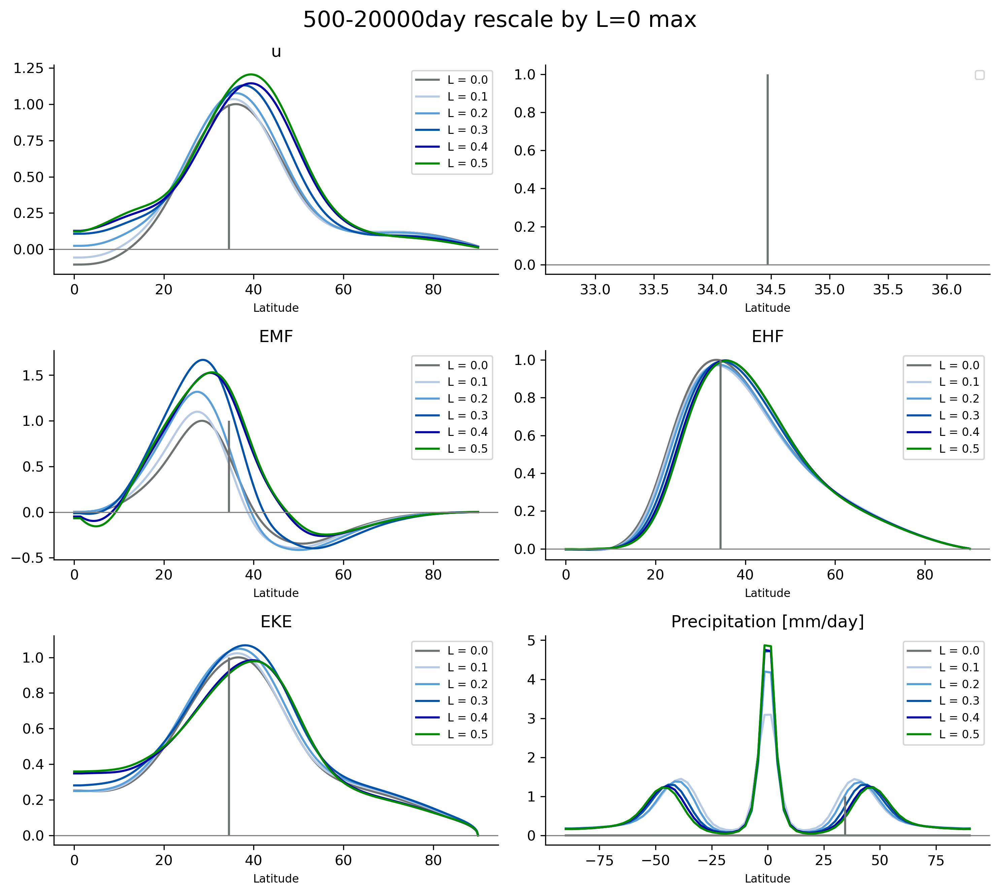

(6, 200, 320)
(6, 200, 320)
(6, 200, 320)


In [19]:
EMF_check, EKE_thin_check, EHF_check, Prec_check = main()
print(EMF_check.shape)
print(EKE_thin_check.shape)
print(EHF_check.shape)


In [20]:
def main_all_level_integration():
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors
    import numpy as np
    from scipy.interpolate import RectBivariateSpline
    import matplotlib as mpl  # Add this line
    a = 0  # Initialize variable 'a'
    interpolation_times = 10
    
    # Define control variables
    EMF_control = None
    EKE_control = None
    EHF_control = None

    pr_file = int((pr_to - pr_start) / pr_leap)

    # Compute cyy
    yys = np.linspace(0, 90, 32 * interpolation_times)
    cyy = np.cos(np.deg2rad(yys))
    
    fig, ax = plt.subplots(3, 2, figsize=(10, 9), dpi=300.)
    mpl.rcParams['axes.linewidth'] = 0.5

    # colors
    rgb=([112,115,115])
    rgb=np.array(rgb)/255.0
    icmap=colors.ListedColormap(rgb,name='my_color')
    cmap=mpl.cm.viridis
    
    cmap_color=icmap  
    # bound=[1E-4,10E-4,25E-4,50e-4,100E-4,150E-4,200E-4,250e-4]
    colors = np.array([[112,115,115],[182,203,227],[89,159,218],[0,83,170],[0,4,167],[0,140,1]])/255

    EMF_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    EHF_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    u_zy_thin_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    EKE_thin_check = np.zeros(((pr_file, 20 * interpolation_times, 32 * interpolation_times)))
    Prec_check     = np.zeros((pr_file, 64))
    
    for pr in range(pr_start, pr_to, pr_leap):
        # sigma coord.
        check_days_length = int(end-start)
        sigma_mean = np.nanmean(Pzm[a,-check_days_length:, :, :] / PSzm[a,-check_days_length:, :, :], axis=(0))
        sigma_onlyz = np.nanmean(sigma_mean, axis=1)
        y = np.linspace(-90, 90, 64)
        yy, sigma_mean2 = np.meshgrid(y, sigma_onlyz)
    
        sigma_mean2s = np.linspace(0, 1, 20 * interpolation_times)  # Define sigma_mean2s here
        
        u_zy = np.nanmean(Uzm[a], axis=(0))
        
        u_zy_thin, yys, cyy = interpolate_data(u_zy, sigma_onlyz, y, interpolation_times)

        biggest_u_y, biggest_u_y_idx = find_nearest(yys, value=y_pr0)
        biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[int(pr / pr_leap)])
        print(biggest_u_z_idx)

        EMF_check[a, :, :]      = EMF[a] # cal_EMF(u_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)
        EKE_thin_check[a, :, :] = EKE[a] # cal_EKE(u_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)
        EHF_check[a, :, :]      = EHF[a] # cal_EHF(Ttm[a], t_prime[a], v_prime[a], sigma_onlyz, y, cyy, interpolation_times)

        Prec_check[a] = Prec[a] # calculate_prec(qv_diff[a], p_half[a])
        # if a == 0:
        u_control   = np.nanmax(np.nanmean(u_zy_thin[:,:],axis=0))
        EMF_control = np.nanmax(np.nanmean(EMF_check[a,:,:], axis=0))
        EHF_control = np.nanmax(np.nanmean(EHF_check[a,:,:], axis=0))
        EKE_control = np.nanmax(np.nanmean(EKE_thin_check[a,:,:], axis=0))
            
        
        # Plot u_zy_thin
        ax[0, 0].plot(yys, np.nanmean(u_zy_thin[:, :], axis=0)/u_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[0, 0].set_title("u")
        
        # Plot EMF_check
        ax[1, 0].plot(yys, np.nanmean(EMF_check[a, :, :], axis=0)/EMF_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[1, 0].set_title("EMF")

        # Plot EKE_thin_check
        ax[2, 0].plot(yys, np.nanmean(EKE_thin_check[a, :, :], axis=0)/EKE_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[2, 0].set_title("EKE")

        # Plot EHF_check
        ax[1, 1].plot(yys, np.nanmean(EHF_check[a, :, :], axis=0)/EHF_control, label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[1, 1].set_title("EHF")
            
        # Plot Prec_mean_y
        ax[2, 1].plot(y, Prec_check[a, :], label=f"L = {pr/100}", color=colors[int(pr/pr_leap)])
        ax[2, 1].set_title("Precipitation [mm/day]")
        

        a += 1

    for i in range(3):
        for j in range(2):
            ax[i, j].vlines(y_pr0, ymin=-0,ymax=1, colors=colors[0])
            ax[i, j].axhline(y=0, color='gray', lw=0.8)
            ax[i, j].spines["right"].set_visible(False)
            ax[i, j].spines["top"].set_visible(False)
            ax[i, j].set_xlabel("Latitude", fontsize=8)
            ax[i, j].legend()
            ax[i, j].legend(prop={'size': 8})
    plt.suptitle("500-20000day all level integration rescale by each L max", fontsize=16)
    plt.tight_layout()
    # plt.savefig("Nick_paper_fig1.png", dpi=600., bbox_inches='tight')
    plt.savefig("Nick_paper_fig1_all level integration_rescale_by_each_L_max.png", dpi=600., bbox_inches='tight')
    
    plt.show()

    return EMF_check, EKE_thin_check, EHF_check, Prec_check

43
43
43
43


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


35
33


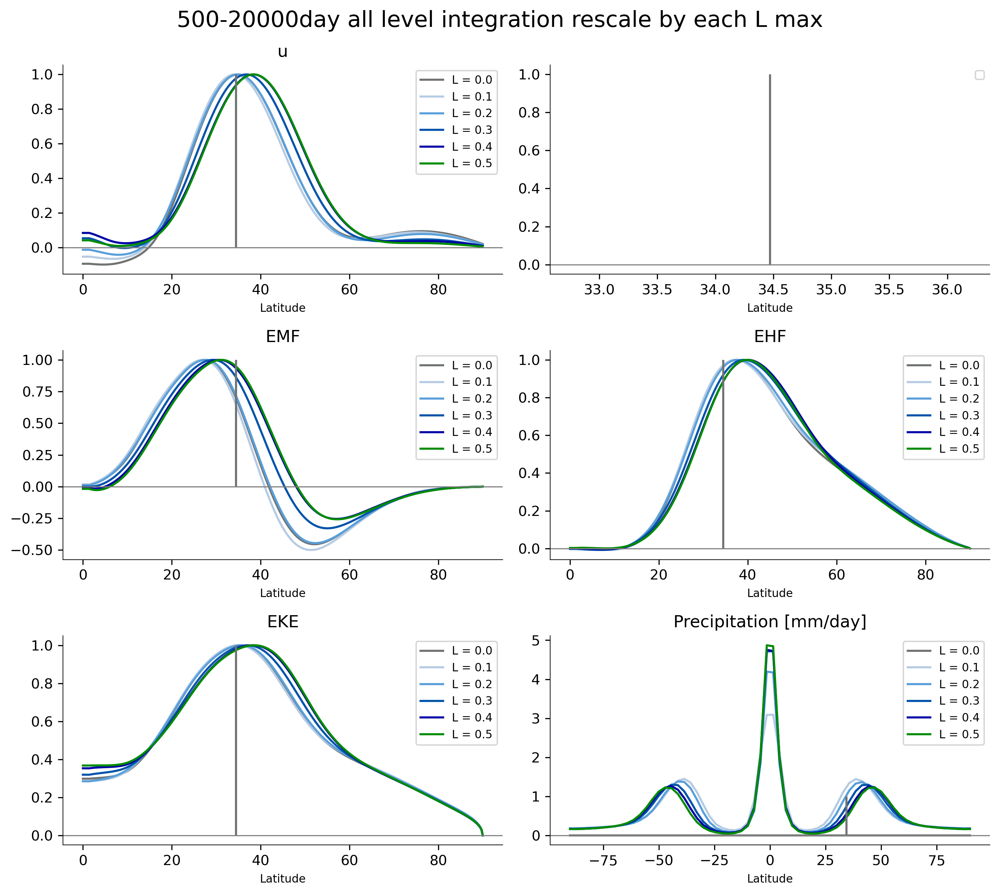

In [21]:
EMF_check, EKE_thin_check, EHF_check, Prec_check = main_all_level_integration()


In [28]:
# with h5py.File('PR10_50_500_20000day_EMF.h5','w') as EMF_file :
#     EMF_file.create_dataset('EMF',data=EMF_check)

# with h5py.File('PR10_50_500_20000day_EKE.h5','w') as EKE_file :
#     EKE_file.create_dataset('EKE',data=EKE_thin_check)

# with h5py.File('PR10_50_500_20000day_EHF.h5','w') as EHF_file :
#     EHF_file.create_dataset('EHF',data=EHF_check)

# print("EMF, EKE, and EHF saving done")

## U y-z profile checking boostrap correction

In [95]:
# print(sigma_mean.shape)

(20, 64, 128)


TypeError: Shapes of x (2560, 64) and z (20, 64) do not match

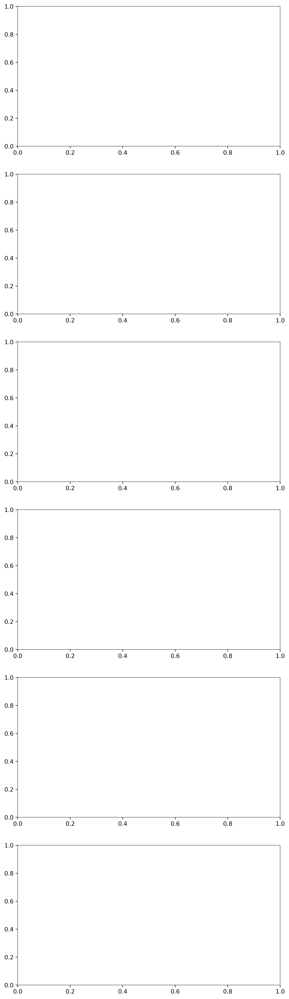

In [92]:
# import matplotlib as mpl  # Add this line

# fig,ax = plt.subplots(6, figsize=(8,30), dpi=300.)
# mpl.rcParams['axes.linewidth'] = 0.5

# check_days_length = int(end-start)

# a = 0
# for i in range(10, 60, 10):
#     sigma_mean = np.nanmean(p[a,-check_days_length:, :, :, :] / ps[a,-check_days_length:, :, :, :], axis=(0, 3))
#     sigma_onlyz = np.nanmean(sigma_mean, axis=1)
#     y = np.linspace(-90, 90, 64)
#     yy, sigma_mean2 = np.meshgrid(y, sigma_onlyz)

#     # biggest_u_y, biggest_u_y_idx = find_nearest(yy, value=y_pr0)
#     # print(z_biggest_all[a])
#     # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2, value=z_biggest_all[a])
#     # print(biggest_u_z)
#     CS = ax[a].contourf(yy, sigma_mean2, np.nanmean(u[a], axis=(0,3)), levels=np.linspace(-30,50,21))
#     plt.colorbar(CS, ax=ax[a])
    
#     ax[a].hlines(z_biggest_all[a], xmin=-90, xmax=90)
    
#     ax[a].set_ylim([1,0])
#     a += 1

# t test

In [241]:
# def cal_self_Martin_et_al_1999(window_length, r1):
#     """
#     T : window length
#     r1: lag one autocorrelation of data1
#     """
#     final = window_length * ( (1-r1[1]) / (1+r1[1]) )
#     return final

# def cal_cross_dof_Martin_et_al_1999(T, r1, r2):
#     """
#     T : window length
#     r1: lag one autocorrelation of data1
#     r2: lag one autocorrelation of data2
#     """
#     final = np.zeros(T)
#     a = 0
#     for i in range(T, 0, -1):
#         final[i] = i * ( (1-r1[1]*r2[1]) / (1+r1[1]*r2[1]) )
#         a += 1
#     return final

# def autocorr1(x,lags):
#     corr = np.zeros(int(lags))
#     for l in range(lags):
#         if l == 0:
#             corr[l] = 1.
#         else:
#             corr[l] = np.corrcoef(x[l:],x[:-l])[0][1]
#     # corr=[1. if l==0 else np.corrcoef(x[l:],x[:-l])[0][1] for l in range(lags)]
#     return np.array(corr)

# from scipy import stats
# import math
# def run_t_test(data1, data2, dof1, dof2):
    
#     # mean
#     data1_mean, data2_mean = np.nanmean(data1), np.nanmean(data2)
#     # standard deviation
#     data1_sd, data2_sd = np.std(data1), np.std(data2)

#     # std^2 / dof
#     std_dof = ( ((data1_sd**2) / dof1) + ((data2_sd**2) / dof2) )**0.5

#     # t-stat
#     t_stat = (data1_mean - data2_mean) / ( std_dof )

#     # std error
#     std_error1 =  data1_sd / np.sqrt(dof1)
#     std_error2 =  data2_sd / np.sqrt(dof2)
    
#     # critical value
#     alpha = 0.1
#     lower_cv1 =  stats.t.ppf(alpha/2      , dof1) #* std_error1
#     high_cv1  =  stats.t.ppf(1.0 - alpha/2, dof1) #* std_error1
#     # print(lower_cv1)

#     # lower_cv1 =  data1_mean - 1.96 * data1_sd / dof1**0.5 
#     # high_cv1  =  data1_mean + 1.96 * data1_sd / dof1**0.5 
    
    
#     # t_test, _ = stats.ttest_rel(data1, data2)
    
#     return t_stat, lower_cv1, high_cv1, _

In [ ]:
# EOF1 = np.zeros(((total_pr, 20, 32)))
# EOF2 = np.zeros(((total_pr, 20, 32)))

# PC1 = np.zeros((total_pr, total_day))
# PC2 = np.zeros((total_pr, total_day))

# explained_all = np.zeros((total_pr, 10))
# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     # EOF1[a], PC1_all[a], EOF2[a], PC2_all[a] = Cal_EOF_PC(EOF, np.nanmean(u[a], axis=(3)))
#     EOF1[a,:], PC1[a,:], EOF2[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC(Uzm[a,:,:,32:], sigma_onlyz_all[a,:])
    
#     a += 1
# print("EOF done")

a= 0
a= 1
a= 2
a= 3
a= 4


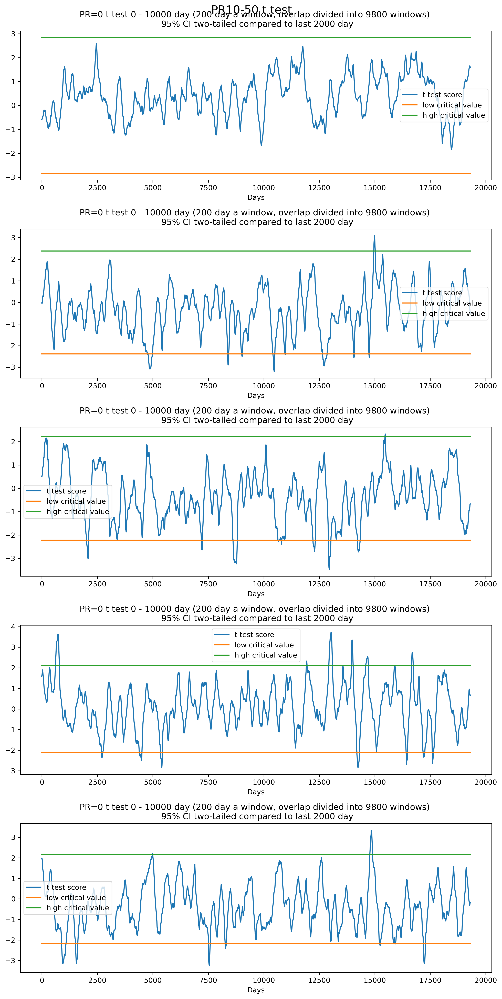

In [246]:
# window_length = 200
# auto_length = 2

# a = 0

# ### all 9500 day do overlap window 
# # PC1_window     = np.zeros((( u.shape[0], int(u.shape[1]/window_length), window_length )))
# # overlap version
# PC1_window      = np.zeros((( total_pr, int(total_day-window_length), window_length )))

# test_stat_all   = np.zeros(( total_pr, PC1_window.shape[1]))
# pvalue_all      = np.zeros(( total_pr, PC1_window.shape[1]))
# cv_all          = np.zeros(( total_pr, PC1_window.shape[1]))

# dof             = np.zeros(( total_pr, int(total_day-window_length)  ))
# window_day_auto = np.zeros((( total_pr, int(total_day-window_length), auto_length )))

# for pr in range(pr_start, pr_to, pr_leap):
#     k = 0
#     for i in range(0, total_day-window_length):
#         # Step 1. Divide PC1 into 100 day window, so I got 9500/100 = 95 windows
#         PC1_window[a,k,:] = (PC1[a,i:i+window_length])
#         k += 1

#     # Step 2. cal autocorrelation
#     last_window_day_auto         = autocorr1(PC1_window[a,-1,:], auto_length)
#     for i in range(PC1_window.shape[1]):
#         window_day_auto[a,i,:]   = autocorr1(PC1_window[a,i,:], auto_length) 

#         # Step 3. cal dof (degree of freedom)
#         dof[a,i]          = cal_self_Martin_et_al_1999(window_length, window_day_auto[a,i,:])
        
#     # print(test_stat)
    
#     a += 1

# # dof_2000 = np.zeros(2000)
# a = 0
# PC1_2000_auto = np.zeros(( total_pr, auto_length ))
# for pr in range(pr_start, pr_to, pr_leap):
#     PC1_2000_auto[a,:]   = autocorr1(PC1[a,-2000:], auto_length)
#     a += 1

# dof_2000 = np.zeros( total_pr )
# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     dof_2000[a] = cal_self_Martin_et_al_1999(window_length, PC1_2000_auto[a,:])
#     a += 1

# t_score_all = np.zeros(( total_pr, int(total_day-window_length) ))
# t_test_all  = np.zeros(( total_pr, int(total_day-window_length) ))

# cv_low_all  = np.zeros(( total_pr, int(total_day-window_length) ))
# cv_high_all = np.zeros(( total_pr, int(total_day-window_length) ))

# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     if a <5:
#         for i in range(PC1_window.shape[1]):
#             ####################### PC1_window
#             t_score, low_cv, high_cv, _ = run_t_test(PC1[a,-2000:], PC1_window[a,i,:], dof_2000[a], dof[a,i])
#             # print(t_score)
#             # print(cv)
            
#             t_score_all[a,i] = t_score
#             # t_test_all[a,i]  = t_test
#             cv_low_all[a,i]  = low_cv
#             cv_high_all[a,i] = high_cv
            
#             # print(i)
#         a += 1

# a = 0
# fig, ax = plt.subplots(total_pr, figsize=(10,20), dpi=300.)
# for pr in range(pr_start, pr_to, pr_leap):

#     ax[a].plot(t_score_all[a, :], label="t test score")
#     # plt.plot(t_test_all[a, ], label="t test score")
    
#     ax[a].plot(cv_low_all[a], label="low critical value")
#     ax[a].plot(cv_high_all[a], label="high critical value")
    
#     ax[a].set_title(f"PR=0 t test 0 - 10000 day ({window_length} day a window, overlap divided into {10000-window_length} windows) \n 95% CI two-tailed compared to last 2000 day")
#     ax[a].set_xlabel("Days")
#     ax[a].legend()
#     print("a=", a)
#     a += 1
# plt.suptitle("PR10-50 t test", fontsize=16)
# plt.tight_layout()
# # plt.savefig("PR10_50_t_test.png", dpi=600., bbox_inches='tight')


In [247]:
# Uzm.shape

(5, 19500, 20, 64)

In [63]:
# print(dof.shape)
# print(last_window_day_auto.shape)
# print(window_day_auto.shape)
# print(PC1_window.shape)
# print(PC1_all.shape)


(5, 19500)
(2,)
(5, 19500, 2)
(5, 19500, 500)
(5, 20000)


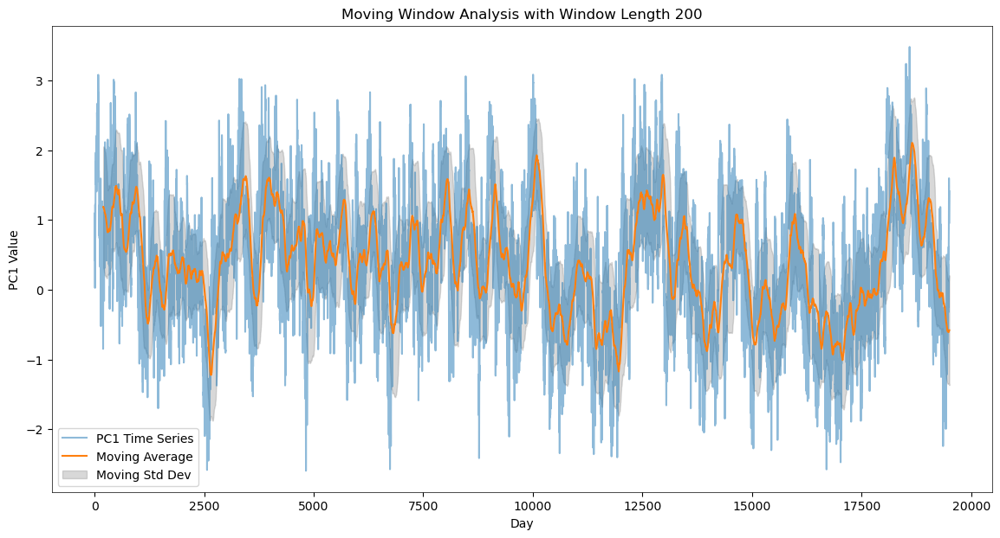

In [245]:
# import numpy as np
# import matplotlib.pyplot as plt

# def moving_analysis(data, window_length):
#     moving_mean = np.convolve(data, np.ones(window_length) / window_length, mode='valid')
#     moving_std = np.sqrt(np.convolve(np.square(data), np.ones(window_length) / window_length, mode='valid') - np.square(moving_mean))
    
#     plt.figure(figsize=(14, 7))
#     plt.plot(data, label='PC1 Time Series', alpha=0.5)
#     plt.plot(np.arange(window_length - 1, len(data)), moving_mean, label='Moving Average')
#     plt.fill_between(np.arange(window_length - 1, len(data)), moving_mean - moving_std, moving_mean + moving_std, color='gray', alpha=0.3, label='Moving Std Dev')
#     plt.title(f'Moving Window Analysis with Window Length {window_length}')
#     plt.xlabel('Day')
#     plt.ylabel('PC1 Value')
#     plt.legend()
#     plt.show()

# # Simulated data (replace this with your actual PC1 data)
# data = PC1[0]# np.random.normal(0, 1, 19500) + np.linspace(-1, 1, 19500)  # Adding a trend for illustration
# window_length = 200  # Example window length
# moving_analysis(data, window_length)


# Fig.2 EOF corelated

## specific level EOF

In [33]:
sigma_onlyz_all = np.zeros((total_pr, 20))
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # sigma coord.
    check_days_length = int(end-start)
    sigma_mean = np.nanmean(Pzm[a,-check_days_length:, :, :] / PSzm[a,-check_days_length:, :, :], axis=(0))
    sigma_onlyz = np.nanmean(sigma_mean, axis=1)
    y = np.linspace(-90, 90, 64)
    yy, sigma_mean2 = np.meshgrid(y, sigma_onlyz)

    # sigma_mean2s = np.linspace(0, 1, 20 * interpolation_times)  # Define sigma_mean2s here
    sigma_onlyz_all[a] = sigma_onlyz
    a += 1
    
# with h5py.File('PR0_50_500_20000day_sigma_onlyz.h5','w') as sigma_onlyz_file :
#     sigma_onlyz_file.create_dataset('sigma_onlyz',data=sigma_onlyz_all)
# test_file      = h5py.File("PR0_50_500_20000day_sigma_onlyz.h5", "r")
# sigma_onlyz       = np.asarray(test_file["sigma_onlyz"][:,:])

In [26]:
# print(sigma_onlyz_all.shape)

In [34]:
def Cal_EOF_PC(input_data):
    from EOF import EOF
    
    # Perform latitude weighting
    input_data_weighted = input_data * np.sqrt(np.cos(np.deg2rad(np.linspace(0, 90, input_data.shape[2]))))

    # Initialize an EOF instance with weighted input data
    n_component = min(input_data.shape[0], input_data.size // input_data.shape[0])

    print("n_component:", n_component)
    eof_instance = EOF((input_data_weighted,), n_components=n_component, field="2D")
    
    # Compute EOFs and PCs
    eof_instance.get()
    
    # Retrieve EOFs and PCs and Extract EOF1, PC1, EOF2, and PC2
    EOF1, EOF2 = eof_instance.EOF[:2]
    PC1, PC2 = eof_instance.PC[:2]

    # Normalize PCs and EOFs
    PC1_norm, PC2_norm = PC1 / PC1.std(), PC2 / PC2.std()
    EOF1_norm, EOF2_norm = EOF1 * PC1.std(), EOF2 * PC2.std()
    
    return EOF1_norm.reshape(20,32), PC1_norm, EOF2_norm.reshape(20,32), PC2_norm, eof_instance.explained[:10]

In [35]:
# $$ai chatgpt



In [36]:
EOF1 = np.zeros(((total_pr, 20, 32)))
EOF2 = np.zeros(((total_pr, 20, 32)))

PC1 = np.zeros((total_pr, total_day))
PC2 = np.zeros((total_pr, total_day))

explained_all = np.zeros((total_pr, 10))

interpolation_times = 10
EOF1_all_thin = np.zeros(((total_pr, 20*interpolation_times, 32*interpolation_times)))
EOF2_all_thin = np.zeros(((total_pr, 20*interpolation_times, 32*interpolation_times)))

# sigma coord.
sigma_onlyz_file      = h5py.File("PR0_50_500_20000day_sigma_onlyz.h5", "r")
sigma_onlyz_all       = np.asarray(sigma_onlyz_file["sigma_onlyz"][:,:])

a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # cal EOF and PC
    # EOF1[a,:], PC1[a,:], EOF2[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC(Uzm[a,:,:,32:], sigma_onlyz_all[a,:])
    EOF1[a,:], PC1[a,:], EOF2[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC(Uzm[a,:,:,32:])
    
    
    # do interpolation
    sigma_mean2s = np.linspace(0,1,20*interpolation_times)
    yys          = np.linspace(0,90,32*interpolation_times)
    interp_spline = RectBivariateSpline(sigma_onlyz_all[a], y[32:], EOF1[a,:,:])
    EOF1_all_thin[a,:,:] = interp_spline(sigma_mean2s, yys)

    interp_spline = RectBivariateSpline(sigma_onlyz_all[a], y[32:], EOF2[a,:,:])
    EOF2_all_thin[a,:,:] = interp_spline(sigma_mean2s, yys)
    a += 1
print("done")

n_component: 640
n_component: 640
n_component: 640
n_component: 640
n_component: 640
n_component: 640
done


In [37]:
# reshape EOF1_all
EOF1_all = np.zeros(((total_pr, 20, 32)))
EOF2_all = np.zeros(((total_pr, 20, 32)))

a = 0
for pr in range(pr_start, pr_to, pr_leap):
    EOF1_all[a] = np.reshape(EOF1[a], (20,32))
    EOF2_all[a] = np.reshape(EOF2[a], (20,32))
    a += 1

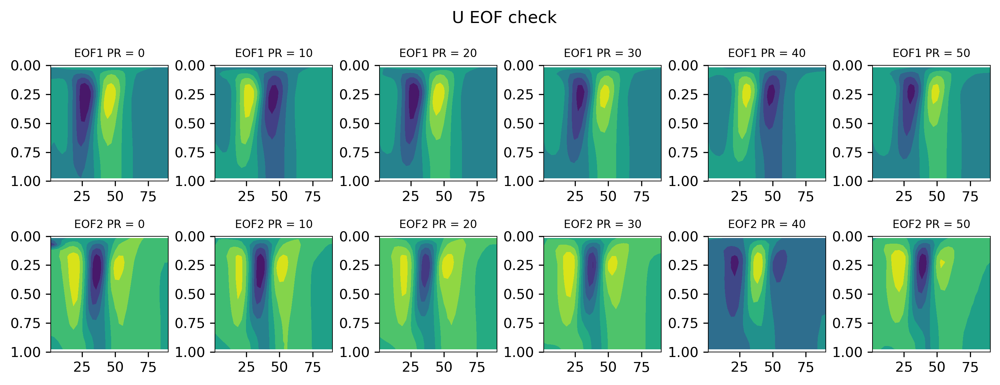

In [38]:
fig, ax = plt.subplots(2,6, figsize=(10,4), dpi=300.)
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    ax[0,a].contourf(yy[:,32:], sigma_mean2[:,32:], EOF1_all[a,:,:])
    ax[0,a].set_ylim([1,0])
    ax[0,a].set_title(f"EOF1 PR = {pr}", fontsize=8)

    ax[1,a].contourf(yy[:,32:], sigma_mean2[:,32:], EOF2_all[a,:,:])
    ax[1,a].set_ylim([1,0])
    ax[1,a].set_title(f"EOF2 PR = {pr}", fontsize=8)
    a+=1
plt.suptitle("U EOF check")
fig.tight_layout(rect=[0, 0.03, 1, 0.999])
# plt.tight_layout()
plt.show()

0.0
1.0
2.0
3.0
4.0
5.0
0.0
1.0
2.0
3.0
4.0
5.0


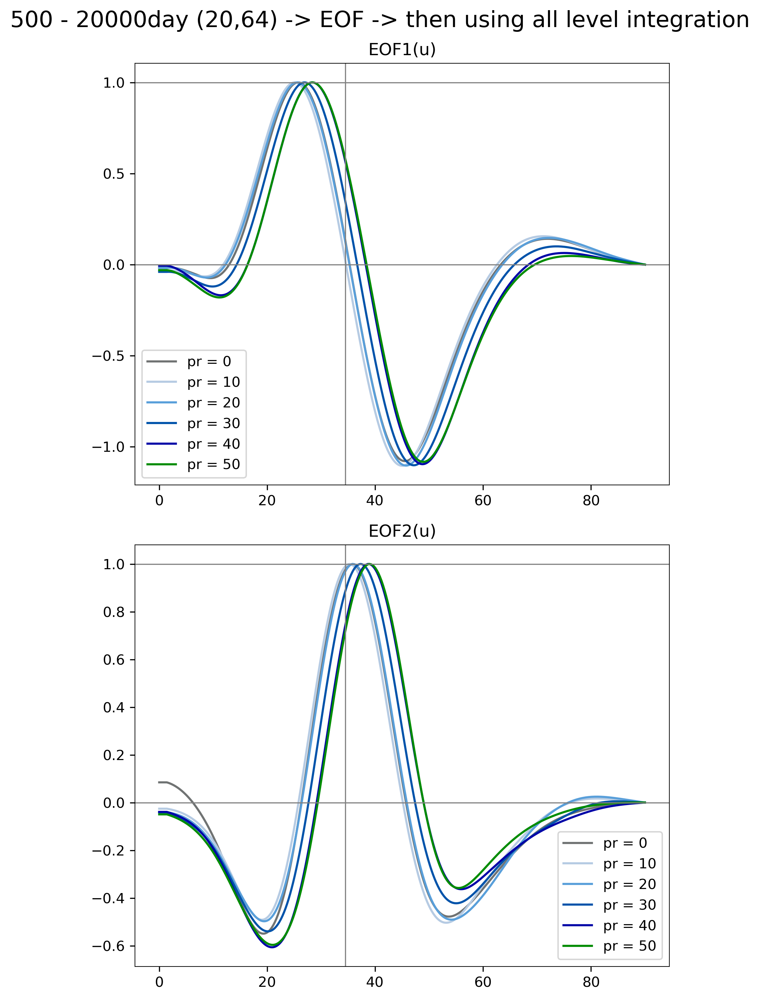

In [39]:
import matplotlib.colors as colors
import matplotlib as mpl

### for color
rgb=([112,115,115])
rgb=np.array(rgb)/255.0
icmap=colors.ListedColormap(rgb,name='my_color')
cmap=mpl.cm.viridis

cmap_color=icmap  
# bound=[1E-4,10E-4,25E-4,50e-4,100E-4,150E-4,200E-4,250e-4]
colors = np.array([[112,115,115],[182,203,227],[89,159,218],[0,83,170],[0,4,167],[0,140,1]])/255
########
yn_thin = np.linspace(0,90, 32* interpolation_times)

fig,ax = plt.subplots(2,figsize=(6,10),dpi=300.)
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[a])
    print(pr/pr_leap)
    # print(biggest_u_z_idx, pr)
    
    # interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], EOF1_all[a,:,:])
    # EOF1_all_thin = interp_spline(sigma_mean2s, yys)
    # if pr == 10:    
        # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    # else:
    # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    if pr == pr_start:
        control = np.max(-np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, (-np.nanmean(EOF1_all_thin[a,:, :], axis=0)/ control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap:
        control = np.max(np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, (np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*2:
        control = np.max(-np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, -(np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*3:
        control = np.max(-np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, (-np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*4:
        control = np.max(np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, (np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*5:
        control = np.max(-np.nanmean(EOF1_all_thin[a,:, :], axis=0))
        ax[0].plot(yn_thin, -(np.nanmean(EOF1_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    # plt.plot(y[:], EOF1_all[a,5, :], label=f"pr = {a*pr_leap}")
    
    a += 1
ax[0].axvline(x=y_pr0, color='gray', lw=0.8) # using u_vertically_bootstrap_latitude.txt
ax[0].axhline(y=1, color='gray', lw=0.8)
ax[0].axhline(y=0, color='gray', lw=0.8)
ax[0].legend()
ax[0].set_title("EOF1(u)")
###########################################################################
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[a])
    print(pr/pr_leap)
    # print(biggest_u_z_idx, pr)
    
    # interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], EOF2_all[a,:,:])
    # EOF2_all_thin = interp_spline(sigma_mean2s, yys)
    # if pr == 10:    
        # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    # else:
    # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    if pr == pr_start:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, -(np.nanmean(EOF2_all_thin[a,:, :], axis=0)/ control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, -(np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*2:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, -(np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])

    if pr == pr_start+pr_leap*3:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, (-np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*4:
        control = np.max(np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, (np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*5:
        control = np.max(-np.nanmean(EOF2_all_thin[a,:, :], axis=0))
        ax[1].plot(yn_thin, -(np.nanmean(EOF2_all_thin[a,:, :], axis=0)/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    # plt.plot(y[:], EOF1_all[a,5, :], label=f"pr = {a*pr_leap}")
    
    a += 1
ax[1].axvline(x=y_pr0, color='gray', lw=0.8)
ax[1].axhline(y=1, color='gray', lw=0.8)
ax[1].axhline(y=0, color='gray', lw=0.8)
ax[1].legend()
ax[1].set_title("EOF2(u)")

# plt.suptitle("500 - 2900day Original grid EOF (using all level integration)", fontsize=16)
plt.suptitle(f"{start} - {end}day (20,64) -> EOF -> then using all level integration", fontsize=16)

plt.tight_layout()
plt.savefig(f"{start} - {end}day (20,64) -> EOF -> then using all level integration.png", dpi=600., bbox_inches="tight")
plt.show()


## All levels integration EOF

In [37]:
# test_file      = h5py.File("PR10_50_500_20000day_sigma_onlyz.h5", "r")
# sigma_onlyz       = np.asarray(test_file["sigma_onlyz"][:,:])

In [40]:
def Cal_EOF_PC_all_level_integration(input_data, sigma_onlyz):
    from EOF import EOF
    # input: (day, lat)
    # Perform latitude weighting
    input_data_weighted = input_data * np.sqrt(np.cos(np.deg2rad(np.linspace(0, 90, input_data.shape[1]))))

    # Initialize an EOF instance with weighted input data
    day = input_data.shape[0]  # day 
    dim1 = input_data.shape[1] # lat
    
    judge = day - dim1
    if judge > 0:
        n_component = dim1
    else:
        n_component = day
        
    print("n_component:", n_component)
    eof_instance = EOF((input_data_weighted,), n_components=n_component, field="1D")
    
    # Compute EOFs and PCs
    eof_instance.get()
    
    # Retrieve EOFs and PCs and Extract EOF1, PC1, EOF2, and PC2
    EOF1 = eof_instance.EOF[0,:]
    EOF2 = eof_instance.EOF[1,:]
    
    PC1 = eof_instance.PC[0,:]
    PC2 = eof_instance.PC[1,:]

    # Normalize PCs and EOFs
    PCs_std = PC1.std()
    PC1_norm = PC1 / PCs_std
    
    PC2s_std = PC2.std()
    PC2_norm = PC2 / PC2s_std
    
    EOFs_std = EOF1.std()
    EOF1_norm = EOF1 * PCs_std
    
    EOF2s_std = EOF2.std()
    EOF2_norm = EOF2 * PC2s_std
    
    return EOF1_norm, PC1_norm, EOF2_norm, PC2_norm, eof_instance.explained[:10]

In [41]:
from scipy.interpolate import interp1d
total_pr = int(total_pr)
EOF1_only_y = np.zeros((total_pr, 32))
EOF2_only_y = np.zeros((total_pr, 32))

PC1 = np.zeros((total_pr, total_day))
PC2 = np.zeros((total_pr, total_day))

explained_all = np.zeros((total_pr, 10))

interpolation_times = 10
EOF1_only_y_all_thin = np.zeros((total_pr, 32*interpolation_times))
EOF2_only_y_all_thin = np.zeros((total_pr, 32*interpolation_times))

# sigma coord.
sigma_onlyz_file      = h5py.File("PR0_50_500_20000day_sigma_onlyz.h5", "r")
sigma_onlyz_all       = np.asarray(sigma_onlyz_file["sigma_onlyz"][:,:])

a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # cal EOF and PC
    EOF1_only_y[a,:], PC1[a,:], EOF2_only_y[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC_all_level_integration(np.nanmean(Uzm[a,:,:,32:], axis=1), sigma_onlyz_all[a,:])
    
    # do interpolation
    # Create a linear interpolation model
    f_linear = interp1d(np.linspace(0,90,32), EOF1_only_y[a,:], kind='linear')

    # Interpolate the data
    yys          = np.linspace(0,90,32*interpolation_times)
    EOF1_only_y_all_thin[a,:] = f_linear(yys)

    f_linear = interp1d(np.linspace(0,90,32), EOF2_only_y[a,:], kind='linear')
    EOF2_only_y_all_thin[a,:] = f_linear(yys)
    
    a += 1
print("done")

n_component: 32
n_component: 32
n_component: 32
n_component: 32
n_component: 32
n_component: 32
done


In [42]:
# print(EOF1_only_y_all_thin.shape)

In [43]:
# # reshape EOF1_all
# EOF1_all = np.zeros(((total_pr, 32)))
# EOF2_all = np.zeros(((total_pr, 20, 32)))

# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     EOF1_all[a] = np.reshape(EOF1[a], (20,32))
#     EOF2_all[a] = np.reshape(EOF2[a], (20,32))
#     a += 1

0.0
1.0
2.0
3.0
4.0
5.0
0.0
1.0
2.0
3.0
4.0
5.0


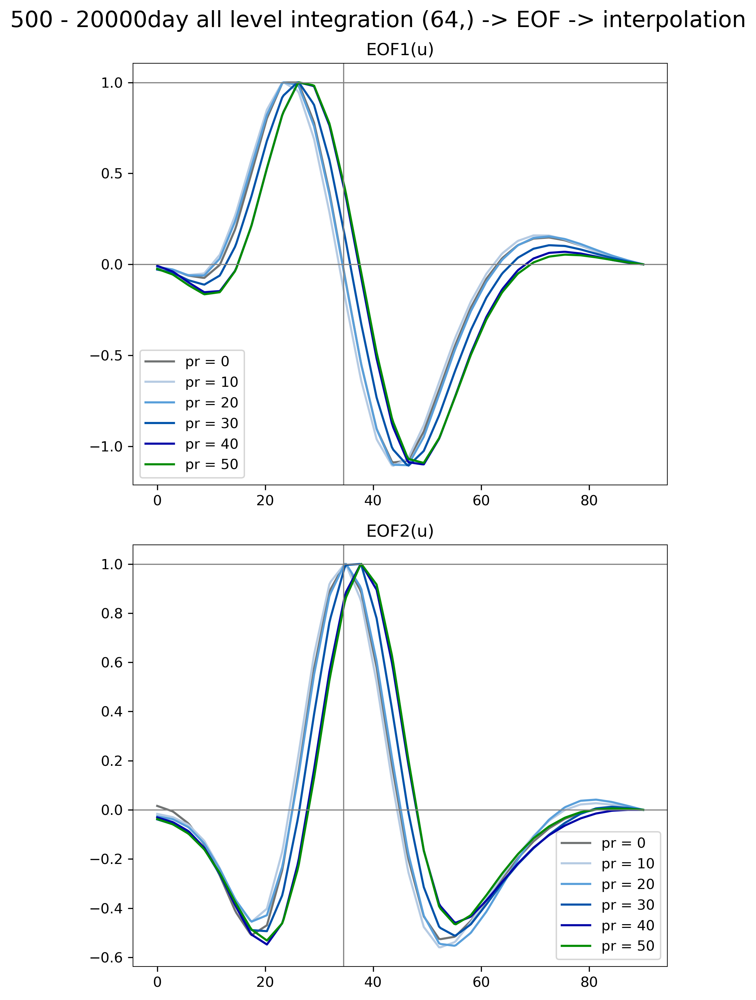

In [44]:
import matplotlib.colors as colors
import matplotlib as mpl

### for color
rgb=([112,115,115])
rgb=np.array(rgb)/255.0
icmap=colors.ListedColormap(rgb,name='my_color')
cmap=mpl.cm.viridis

cmap_color=icmap  
# bound=[1E-4,10E-4,25E-4,50e-4,100E-4,150E-4,200E-4,250e-4]
colors = np.array([[112,115,115],[182,203,227],[89,159,218],[0,83,170],[0,4,167],[0,140,1]])/255
########
yn_thin = np.linspace(0,90, 32* interpolation_times)

fig,ax = plt.subplots(2,figsize=(6,10),dpi=300.)
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[a])
    print(pr/pr_leap)
    # print(biggest_u_z_idx, pr)
    
    # interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], EOF1_all[a,:,:])
    # EOF1_all_thin = interp_spline(sigma_mean2s, yys)
    # if pr == 10:    
        # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    # else:
    # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    if pr == pr_start:
        control = np.max(-EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, (-EOF1_only_y_all_thin[a,:]/ control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap:
        control = np.max(EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, (EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*2:
        control = np.max(-EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, -(EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*3:
        control = np.max(-EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, (-EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*4:
        control = np.max(EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, (EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*5:
        control = np.max(-EOF1_only_y_all_thin[a,:])
        ax[0].plot(yn_thin, -(EOF1_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    # plt.plot(y[:], EOF1_all[a,5, :], label=f"pr = {a*pr_leap}")
    
    a += 1
ax[0].axvline(x=y_pr0, color='gray', lw=0.8) # using u_vertically_bootstrap_latitude.txt
ax[0].axhline(y=1, color='gray', lw=0.8)
ax[0].axhline(y=0, color='gray', lw=0.8)
ax[0].legend()
ax[0].set_title("EOF1(u)")
###########################################################################
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    # biggest_u_z, biggest_u_z_idx = find_nearest(sigma_mean2s, value=z_biggest_all[a])
    print(pr/pr_leap)
    # print(biggest_u_z_idx, pr)
    
    # interp_spline = RectBivariateSpline(sigma_onlyz, y[32:], EOF2_all[a,:,:])
    # EOF2_all_thin = interp_spline(sigma_mean2s, yys)
    # if pr == 10:    
        # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    # else:
    # plt.plot(yys, EOF1_all_thin[biggest_u_z_idx, :], label=f"pr = {a*pr_leap}")
    if pr == pr_start:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, -(EOF2_only_y_all_thin[a,:]/ control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, -(EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*2:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, -(EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])

    if pr == pr_start+pr_leap*3:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, (-EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*4:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, (-EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    if pr == pr_start+pr_leap*5:
        control = np.max(-EOF2_only_y_all_thin[a,:])
        ax[1].plot(yn_thin, -(EOF2_only_y_all_thin[a,:]/control), label=f"pr = {a*pr_leap}", color=colors[int(pr/pr_leap)])
    # plt.plot(y[:], EOF1_all[a,5, :], label=f"pr = {a*pr_leap}")
    
    a += 1
ax[1].axvline(x=y_pr0, color='gray', lw=0.8)
ax[1].axhline(y=1, color='gray', lw=0.8)
ax[1].axhline(y=0, color='gray', lw=0.8)
ax[1].legend()
ax[1].set_title("EOF2(u)")

# plt.suptitle("500 - 2900day Original grid EOF (using all level integration)", fontsize=16)
plt.suptitle(f"{start} - {end}day all level integration (64,) -> EOF -> interpolation", fontsize=16)

plt.tight_layout()
plt.savefig(f"{start} - {end}day all level integration (64,) -> EOF -> interpolation.png", dpi=600., bbox_inches="tight")
plt.show()


# Explained

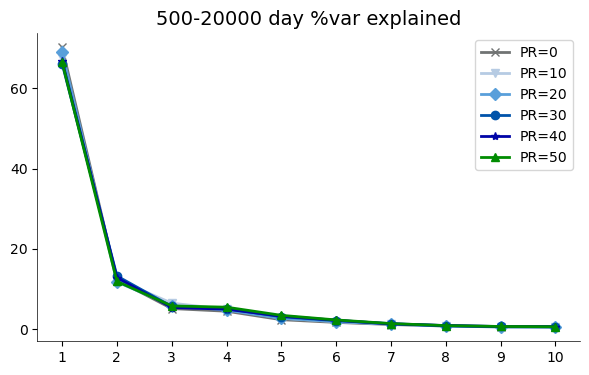

In [45]:
xxx = np.arange(1,11,1)
fig,ax = plt.subplots(figsize=(7,4), dpi=100)
a = 0
for pr in range(pr_start, pr_to, pr_leap):
    if pr == pr_start:
        ax.plot(xxx, explained_all[a,:10]*100, "-x", color=colors[int(pr/pr_leap)], lw=2, label="PR=0")
    if pr == pr_start+pr_leap:
        ax.plot(xxx, explained_all[a,:10]*100, "-", color=colors[int(pr/pr_leap)], lw=2, marker='v', label="PR=10")
    if pr == pr_start+pr_leap*2:
        ax.plot(xxx, explained_all[a,:10]*100, "-D", color=colors[int(pr/pr_leap)], lw=2, label="PR=20")
    if pr == pr_start+pr_leap*3:
        ax.plot(xxx, explained_all[a,:10]*100, "-o", color=colors[int(pr/pr_leap)], lw=2, label="PR=30")
    if pr == pr_start+pr_leap*4:
        ax.plot(xxx, explained_all[a,:10]*100, "-*", color=colors[int(pr/pr_leap)], lw=2, label="PR=40")
    if pr == pr_start+pr_leap*5:
        ax.plot(xxx, explained_all[a,:10]*100, "-^", color=colors[int(pr/pr_leap)], lw=2, label="PR=50")
    a += 1
# plt.grid()
plt.title(f"{start}-{end} day %var explained", fontsize=14)
plt.xticks(np.arange(1,11,1))
plt.yticks(np.arange(0,80,20))
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.legend()
plt.savefig("%var explained.png", dpi=600., bbox_inches="tight")


# Autocorrelation

In [46]:
def autocorr1(x,lags):
    corr = np.zeros(int(lags))
    for l in range(lags):
        if l == 0:
            corr[l] = 1.
        else:
            corr[l] = np.corrcoef(x[l:],x[:-l])[0][1]
    # corr=[1. if l==0 else np.corrcoef(x[l:],x[:-l])[0][1] for l in range(lags)]
    return np.array(corr)

In [47]:
PC1_all = PC1
PC2_all = PC2
print(PC1_all.shape)

(6, 19500)


In [48]:
auto_length = 100
yyy_thin  = autocorr1(PC1_all[0,:], auto_length) 
yyy2_thin = autocorr1(PC1_all[1,:], auto_length) 
yyy3_thin = autocorr1(PC1_all[2,:], auto_length) 
yyy4_thin = autocorr1(PC1_all[3,:], auto_length) 
yyy5_thin = autocorr1(PC1_all[4,:], auto_length) 
yyy6_thin = autocorr1(PC1_all[5,:], auto_length) 

yyy_thin2  = autocorr1(PC2_all[0,:], auto_length) 
yyy2_thin2 = autocorr1(PC2_all[1,:], auto_length) 
yyy3_thin2 = autocorr1(PC2_all[2,:], auto_length) 
yyy4_thin2 = autocorr1(PC2_all[3,:], auto_length) 
yyy5_thin2 = autocorr1(PC2_all[4,:], auto_length) 
yyy6_thin2 = autocorr1(PC2_all[5,:], auto_length) 

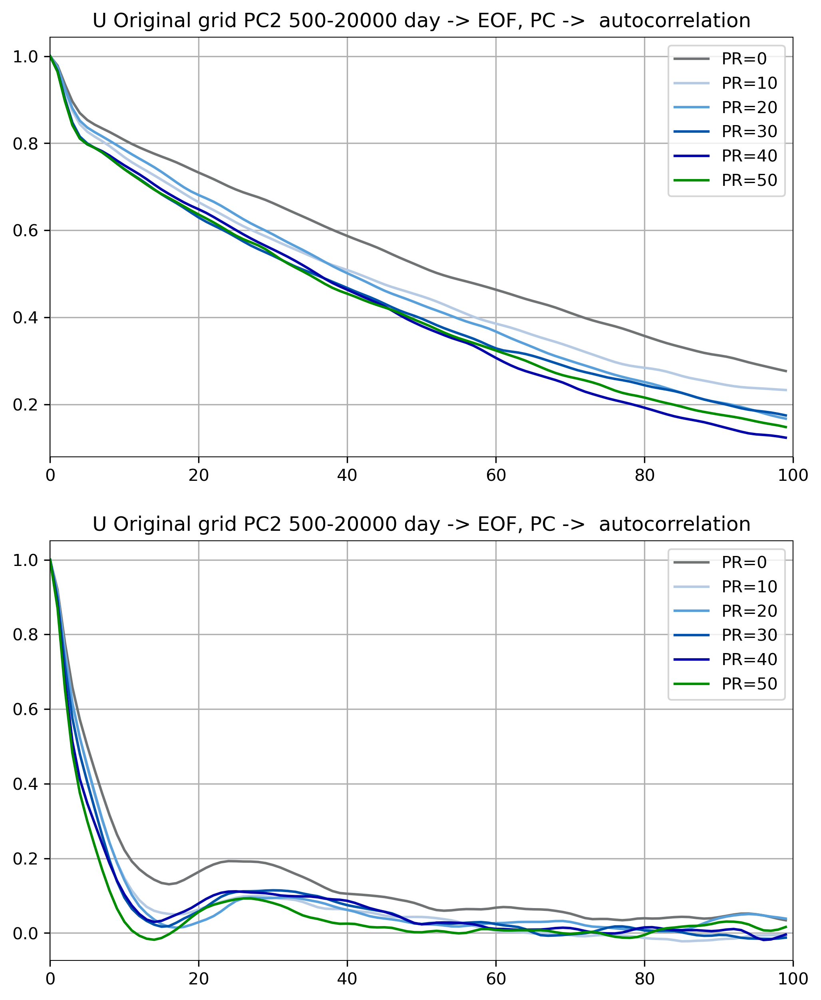

In [49]:
tau = np.arange(0,auto_length,1)
fig, ax = plt.subplots(2,figsize=(8,10),dpi=300)
ax[0].plot(tau, yyy_thin , label=f"PR={pr_start}", color=colors[0])
ax[0].plot(tau, yyy2_thin, label=f"PR={pr_start+pr_leap}", color=colors[1])
ax[0].plot(tau, yyy3_thin, label=f"PR={pr_start+pr_leap*2}", color=colors[2])
ax[0].plot(tau, yyy4_thin, label=f"PR={pr_start+pr_leap*3}", color=colors[3])
ax[0].plot(tau, yyy5_thin, label=f"PR={pr_start+pr_leap*4}", color=colors[4])
ax[0].plot(tau, yyy6_thin, label=f"PR={pr_start+pr_leap*5}", color=colors[5])
ax[0].legend()
ax[0].set_xlim([0,auto_length])
# ax[0].set_title("Original grid PC1 500-2900 day -> EOF, PC ->  autocorrelation")
ax[0].set_title(f"U Original grid PC2 {start}-{end} day -> EOF, PC ->  autocorrelation")


ax[0].grid()

###############################################################

ax[1].plot(tau, yyy_thin2 , label=f"PR={pr_start}", color=colors[0])
ax[1].plot(tau, yyy2_thin2, label=f"PR={pr_start+pr_leap}", color=colors[1])
ax[1].plot(tau, yyy3_thin2, label=f"PR={pr_start+pr_leap*2}", color=colors[2])
ax[1].plot(tau, yyy4_thin2, label=f"PR={pr_start+pr_leap*3}", color=colors[3])
ax[1].plot(tau, yyy5_thin2, label=f"PR={pr_start+pr_leap*4}", color=colors[4])
ax[1].plot(tau, yyy6_thin2, label=f"PR={pr_start+pr_leap*5}", color=colors[5])
ax[1].legend()
ax[1].set_xlim([0,auto_length])
# ax[1].set_title("Original grid PC2 500-2900 day -> EOF, PC ->  autocorrelation")
ax[1].set_title(f"U Original grid PC2 {start}-{end} day -> EOF, PC ->  autocorrelation")

ax[1].grid()
plt.savefig("Autocorrelation original grid PC12(500 - 10000 day).png", dpi=600., bbox_inches="tight")
plt.show()

# $dlog(C_{z_{1}z_{1}}) / d\tau$

PR=0,a= 0.984971435702502
PR=10,a= 0.9813656867947164
PR=20,a= 0.9809976852190898
PR=30,a= 0.978660315720553
PR=40,a= 0.9776393130617593
PR=50,a= 0.9779598933182568


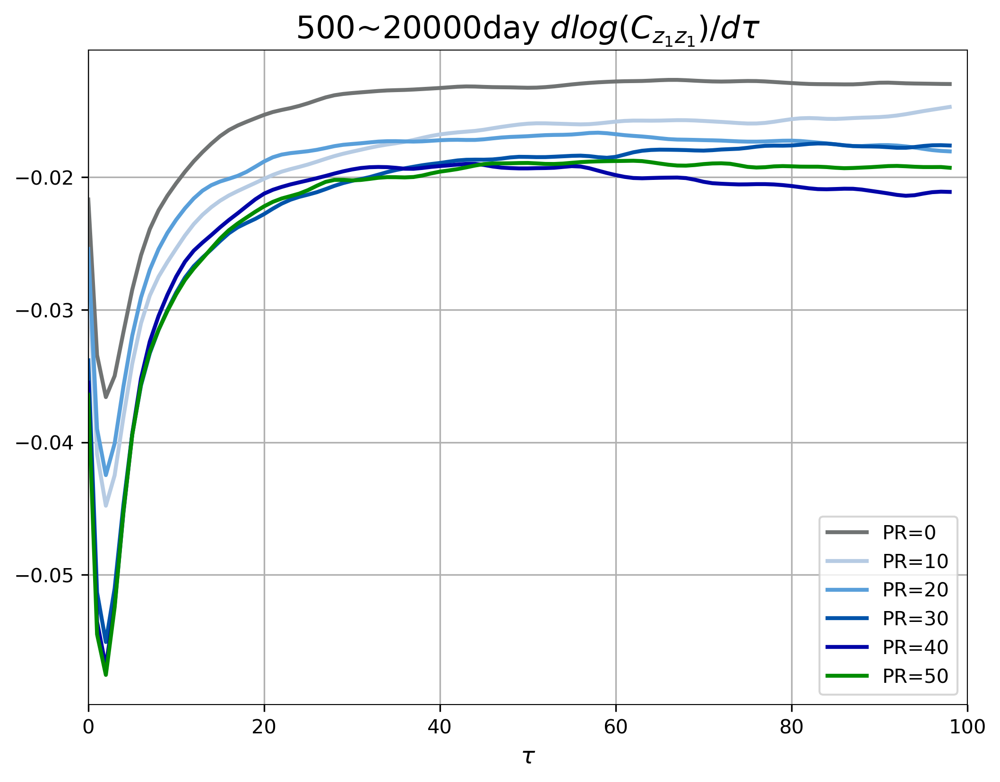

In [50]:
plt.figure(figsize=(8,6), dpi=300)
total_pr = int(total_pr)
length = 100
total_L_final = np.zeros(total_pr)
total_L = np.zeros((total_pr,length))
aa  = 0
for pr in range(pr_start, pr_to, pr_leap):
    for i in range(1,len(total_L[aa,:])):
        if aa == 0:
            total_L[aa,i]      = np.log(yyy_thin[i])/int(i)
        if aa == 1:
            total_L[aa,i]      = np.log(yyy2_thin[i])/int(i)
        elif aa == 2:
            total_L[aa,i]      = np.log(yyy3_thin[i])/int(i)
        elif aa == 3:
            total_L[aa,i]      = np.log(yyy4_thin[i])/int(i)
        elif aa == 4:
            total_L[aa,i]      = np.log(yyy5_thin[i])/int(i)
        elif aa == 5:
            total_L[aa,i]      = np.log(yyy6_thin[i])/int(i)
            
        total_L_final[aa] += total_L[aa,i] 
    total_L_final[aa] /= len(total_L[aa,1:])
    plt.plot(total_L[aa,1:], label=f"PR={aa*pr_leap}", color=colors[int(pr/pr_leap)], lw=2)
    plt.legend()
    print(f"PR={aa*10},a=", np.exp(total_L_final[aa]))
    aa += 1
plt.title(f"{start}~{end}day" + r" $dlog(C_{z_{1}z_{1}}) / d\tau$", fontsize=16)
plt.xlabel(r"$\tau $", fontsize=12)
# plt.xticks(np.arange(0,length-1), np.arange(1,length), fontsize=12)
plt.xlim([0,100])
plt.grid()
plt.savefig("dCz1z1dtau.png", dpi=600.)
plt.show()

# TEM

In [50]:
import numpy as np
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt

class TEM_dp_Sukiyoung_fit_zonalmean:
    def __init__(self, Vzm, Omega_zm, Pzm, PSzm, Tzm, Z_full_zm, THzm, v_prime, theta_prime, sigma_mean, total_pr, total_day, single_day):
        self.Rd = 287
        self.cp = 1004
        self.g = 9.81
        self.a = 6.37122e6
        self.Vzm = Vzm
        self.Omega_zm = Omega_zm
        self.Pzm = Pzm
        self.PSzm = PSzm
        self.Tzm = Tzm
        self.Zzm = Z_full_zm
        self.Vza = v_prime
        self.THza = theta_prime
        self.sigma_mean = sigma_mean
        self.total_pr = total_pr
        self.total_day = total_day
        self.single_day = single_day
        self.setup_dimensions()
        self.compute_means()

    def setup_dimensions(self):
        self.day = 1 if self.single_day else self.total_day
        self.lev = 20  # Assuming a fixed number of levels for simplicity
        self.lat = 64  # Assuming a fixed number of latitudes for simplicity

    def compute_means(self):
        axis = (1,) if self.single_day else (0, 2)
        self.p_onlyz = np.nanmean(self.Pzm, axis=axis)
        self.Vzmtm = np.nanmean(self.Vzm, axis=0)
        self.sigma_onlyz = np.nanmean(self.sigma_mean, axis=1)
        self.y = np.linspace(-90, 90, self.lat)
        self.yy, self.sigma_mean2 = np.meshgrid(self.y, self.sigma_onlyz)
        self.rho = self.Pzm / self.PSzm
        self.Wzm = -self.Omega_zm / (self.rho * self.g)
        self.Wzmtm = np.nanmean(self.Wzm, axis=0)
        self.theta = self.Tzm * (self.PSzm / self.Pzm) ** (self.Rd / self.cp)
        # self.phi = np.deg2rad(self.y)  # Get latitude in radians
        self.phi = np.broadcast_to(np.deg2rad(self.y).reshape(1,self.lat),(self.lev,self.lat)) # Get latitude in radians
        self.cphi = np.cos(self.phi) 
        self.acphi = self.a * self.cphi

    def calculate_vTEM_wTEM(self):
        # Calculate v* and w* components
        THzmtm = np.nanmean(self.theta, axis=(2 if self.single_day else 0))
        dTHdp = np.gradient(THzmtm, self.p_onlyz, axis=0, edge_order=2)
        VTHETA = self.Vza * self.THza
        VTHzm = np.nanmean(VTHETA, axis=2 if self.single_day else 3)
        VTHzmtm = np.nanmean(VTHzm, axis=0)
        vTEM_temp = VTHzmtm / dTHdp
        vTEM_tempdz = np.gradient(vTEM_temp, self.p_onlyz, axis=0, edge_order=2)
        vTEM = self.Vzmtm - vTEM_tempdz
        
        wTEM_temp = self.cphi * VTHzmtm / dTHdp
        lat_spacing = np.mean(np.diff(np.deg2rad(self.y)))  # Assuming even spacing for simplicity
        wTEM_tempdphi = np.gradient(wTEM_temp, lat_spacing, axis=1, edge_order=2)
        wTEM = self.Wzmtm - wTEM_tempdphi / self.acphi
        
        # Apply Gaussian filtering
        vTEM_smoothed = gaussian_filter(vTEM, sigma=[0, 1])
        wTEM_smoothed = gaussian_filter(wTEM, sigma=[0, 1])
        
        return vTEM_smoothed, wTEM_smoothed
        # return vTEM, wTEM
        

    def improved_derivative(y, x):
        dydx = np.zeros_like(y)
        # Handle boundaries with first-order accurate differences
        dydx[0] = (y[1] - y[0]) / (x[1] - x[0])  # Forward difference at the start
        dydx[-1] = (y[-1] - y[-2]) / (x[-1] - x[-2])  # Backward difference at the end
    
        # Higher-order central differences for the interior points
        dydx[1:-1] = (y[2:] - y[:-2]) / (x[2:] - x[:-2])
        return dydx

    def linear_extrapolate(self, psi):
        # Assuming psi[-2, :] and psi[-3, :] are the two points before the boundary
        gradient = psi[-2, :] - psi[-3, :]
        psi[-1, :] = psi[-2, :] + gradient  # Extrapolate to the next point
        return psi
    
    def calculate_psi(self, vTEM, wTEM):
        psi_w1 = np.zeros_like(vTEM)
        psi_w1[0, :] = 0  # Initialize the first level
        
        # Calculate psi using the vertical integration
        for ilev in range(1, self.lev - 1):  # Stop calculation one level before the last
            dlev = self.p_onlyz[ilev] - self.p_onlyz[ilev-1]  
            psi_w1[ilev, :] = psi_w1[ilev-1, :] - 2 * np.pi / self.g * self.acphi[ilev, :] * (dlev * vTEM[ilev, :])
    
        # Extrapolate to the last level
        psi_w1 = self.linear_extrapolate(psi_w1)
    
        return psi_w1

    def plot_psi(self, psi):
        fig, ax = plt.subplots(figsize=(8, 6), dpi=100)
        CS = ax.contourf(self.yy, self.sigma_mean2, psi, levels=21, cmap="RdBu_r", extend="both")
        plt.colorbar(CS, ax=ax)
        ax.set_ylim([1, 0])
        ax.set_title("Stream Function $\psi$ (kg s$^{-1}$) after Gaussian filter")
        # ax.set_title("Stream Function $\psi$ (kg s$^{-1}$)")
        
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(8,6), dpi=150.)
        CS = plt.contour(yy,sigma_mean2, psi / 10**9, levels=21, colors='k') # 
        plt.clabel(CS)
        plt.ylim([1,0])
        plt.title("TEM ( 10^9 kg $m^{-1}$ $s^{-1}$) 500-20000day PR10 after Gaussian filter", fontsize=16)
        # plt.title("TEM ( 10^9 kg $m^{-1}$ $s^{-1}$) 500-20000day PR10", fontsize=16)
        
        # plt.savefig("TEM_PR10.png", dpi=600., bbox_inches='tight')
        plt.show()

    def process_and_plot(self):
        vTEM, wTEM = self.calculate_vTEM_wTEM()
        psi = self.calculate_psi(vTEM, wTEM)
        # self.plot_vTEM_wTEM(vTEM, wTEM)
        self.plot_psi(psi)

# Usage of this class would involve instantiation with appropriate data arrays for the input parameters and calling process_and_plot().


In [53]:
str = "tmp_zonal_mean"
v_file1      = h5py.File(str+"PR10_50_0_10000day_v.h5", "r")
v_file2      = h5py.File(str+"PR10_50_10000_20000day_v.h5", "r")

v1       = np.asarray(v_file1["v"][:,:,:,:])
v2       = np.asarray(v_file2["v"][:,:,:,:])
#################################################################
w_file1      = h5py.File(str+"PR10_50_0_10000day_w.h5", "r")
w_file2      = h5py.File(str+"PR10_50_10000_20000day_w.h5", "r")

w1       = np.asarray(w_file1["w"][:,:,:,:])
w2       = np.asarray(w_file2["w"][:,:,:,:])
#################################################################
p_file1      = h5py.File(str+"PR10_50_0_10000day_p.h5", "r")
p_file2      = h5py.File(str+"PR10_50_10000_20000day_p.h5", "r")

p1       = np.asarray(p_file1["p"][:,:,:,:])
p2       = np.asarray(p_file2["p"][:,:,:,:])
#################################################################
t_file1      = h5py.File(str+"PR10_50_0_10000day_t.h5", "r")
t_file2      = h5py.File(str+"PR10_50_10000_20000day_t.h5", "r")

t1       = np.asarray(t_file1["t"][:,:,:,:])
t2       = np.asarray(t_file2["t"][:,:,:,:])
#################################################################
z_file1      = h5py.File(str+"PR10_50_0_10000day_z_full.h5", "r")
z_file2      = h5py.File(str+"PR10_50_10000_20000day_z_full.h5", "r")

z1       = np.asarray(z_file1["z_full"][:,:,:,:])
z2       = np.asarray(z_file2["z_full"][:,:,:,:])
#################################################################
ps_file1      = h5py.File(str+"PR10_50_0_10000day_ps.h5", "r")
ps_file2      = h5py.File(str+"PR10_50_10000_20000day_ps.h5", "r")

ps1       = np.asarray(ps_file1["ps"][:,:,:,:])
ps2       = np.asarray(ps_file2["ps"][:,:,:,:])
#################################################################
theta_file1      = h5py.File(str+"PR10_50_500_20000day_theta.h5", "r")
# theta_file2      = h5py.File(str+"PR10_50_10000_20000day_theta.h5", "r")

# theta1       = np.asarray(theta_file1["theta"][:,:,:,:])
theta1       = np.asarray(theta_file1["theta"][:,:,:,:])


In [54]:
Vzm = np.append(v1[:,start:], v2, axis=1)
Omega_zm = np.append(w1[:,start:], w2, axis=1)
Pzm = np.append(p1[:,start:], p2, axis=1)
Tzm = np.append(t1[:,start:], t2, axis=1)
Z_full_zm = np.append(z1[:,start:], z2, axis=1)
PSzm = np.append(ps1[:,start:], ps2, axis=1)
TH_zm = theta1




In [58]:
v_prime_file      = h5py.File("PR10_50_500_20000day_v_prime.h5", "r")
theta_prime_file  = h5py.File("PR10_50_500_20000day_theta_prime.h5", "r")


v_prime     = np.asarray(v_prime_file["v_prime"][:,:,:,:,:])
theta_prime = np.asarray(theta_prime_file["theta_prime"][:,:,:,:,:])


In [59]:
# print(PSzm.shape)

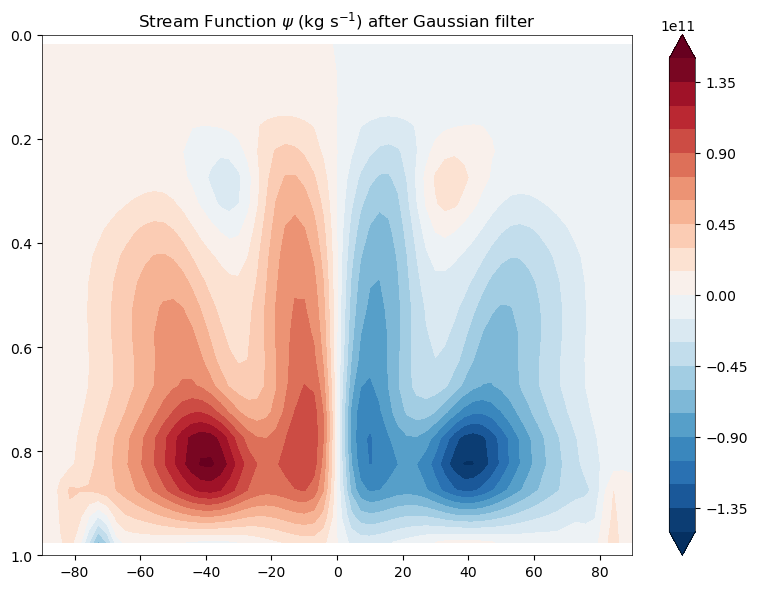

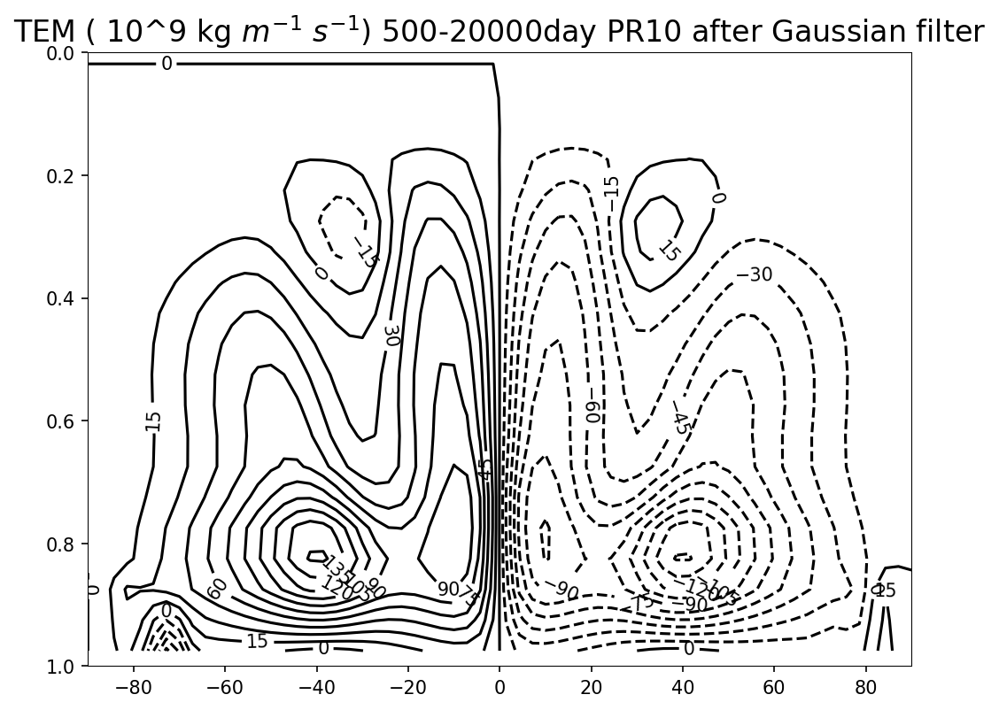

In [60]:
a = 1
tem = TEM_dp_Sukiyoung_fit_zonalmean(Vzm[a,:], Omega_zm[a,:], Pzm[a,:], PSzm[a,:], Tzm[a,:], Z_full_zm[a,:], TH_zm[a,:], v_prime[a,:], theta_prime[a,:], sigma_mean, total_pr, total_day, False)
tem.process_and_plot()

In [ ]:

# a = 0
# for pr in range(pr_start, pr_to, pr_leap):
#     # cal EOF and PC
#     EOF1[a,:], PC1[a,:], EOF2[a,:], PC2[a,:], explained_all[a,:] = Cal_EOF_PC(Uzm[a,:,:,32:], sigma_onlyz_all[a,:])

# Three cell circulation

In [166]:
import numpy as np
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt

class TEM_dp_Sukiyoung_fit_zonalmean_Three_cell_circulation:
    def __init__(self, Vzm, Omega_zm, Pzm, PSzm, Tzm, Z_full_zm, THzm, v_prime, theta_prime, sigma_mean, total_pr, total_day, single_day):
        self.Rd = 287
        self.cp = 1004
        self.g = 9.81
        self.a = 6.37122e6
        self.Vzm = Vzm
        self.Omega_zm = Omega_zm
        self.Pzm = Pzm
        self.PSzm = PSzm
        self.Tzm = Tzm
        self.Zzm = Z_full_zm
        self.Vza = v_prime
        self.THza = theta_prime
        self.sigma_mean = sigma_mean
        self.total_pr = total_pr
        self.total_day = total_day
        self.single_day = single_day
        self.setup_dimensions()
        self.compute_means()

    def setup_dimensions(self):
        self.day = 1 if self.single_day else self.total_day
        self.lev = 20  # Assuming a fixed number of levels for simplicity
        self.lat = 64  # Assuming a fixed number of latitudes for simplicity

    def compute_means(self):
        axis = (1,) if self.single_day else (0, 2)
        self.p_onlyz = np.nanmean(self.Pzm, axis=axis)
        self.Vzmtm = np.nanmean(self.Vzm, axis=0)
        self.sigma_onlyz = np.nanmean(self.sigma_mean, axis=1)
        self.y = np.linspace(-90, 90, self.lat)
        self.yy, self.sigma_mean2 = np.meshgrid(self.y, self.sigma_onlyz)
        self.rho = self.Pzm / self.PSzm
        self.Wzm = -self.Omega_zm / (self.rho * self.g)
        self.Wzmtm = np.nanmean(self.Wzm, axis=0)
        self.theta = self.Tzm * (self.PSzm / self.Pzm) ** (self.Rd / self.cp)
        # self.phi = np.deg2rad(self.y)  # Get latitude in radians
        self.phi = np.broadcast_to(np.deg2rad(self.y).reshape(1,self.lat),(self.lev,self.lat)) # Get latitude in radians
        self.cphi = np.cos(self.phi) 
        self.acphi = self.a * self.cphi

    def calculate_vTEM_wTEM(self):
        # Calculate v* and w* components
        THzmtm = np.nanmean(self.theta, axis=(2 if self.single_day else 0))
        dTHdp = np.gradient(THzmtm, self.p_onlyz, axis=0, edge_order=2)
        VTHETA = self.Vza * self.THza
        VTHzm = np.nanmean(VTHETA, axis=2 if self.single_day else 3)
        VTHzmtm = np.nanmean(VTHzm, axis=0)
        vTEM_temp = VTHzmtm / dTHdp
        vTEM_tempdz = np.gradient(vTEM_temp, self.p_onlyz, axis=0, edge_order=2)
        vTEM = self.Vzmtm #- vTEM_tempdz
        
        wTEM_temp = self.cphi * VTHzmtm / dTHdp
        lat_spacing = np.mean(np.diff(np.deg2rad(self.y)))  # Assuming even spacing for simplicity
        wTEM_tempdphi = np.gradient(wTEM_temp, lat_spacing, axis=1, edge_order=2)
        wTEM = self.Wzmtm #- wTEM_tempdphi / self.acphi
        
        # Apply Gaussian filtering
        vTEM_smoothed = gaussian_filter(vTEM, sigma=[0, 1])
        wTEM_smoothed = gaussian_filter(wTEM, sigma=[0, 1])
        
        return vTEM_smoothed, wTEM_smoothed
        # return vTEM, wTEM
        

    def improved_derivative(y, x):
        dydx = np.zeros_like(y)
        # Handle boundaries with first-order accurate differences
        dydx[0] = (y[1] - y[0]) / (x[1] - x[0])  # Forward difference at the start
        dydx[-1] = (y[-1] - y[-2]) / (x[-1] - x[-2])  # Backward difference at the end
    
        # Higher-order central differences for the interior points
        dydx[1:-1] = (y[2:] - y[:-2]) / (x[2:] - x[:-2])
        return dydx

    def linear_extrapolate(self, psi):
        # Assuming psi[-2, :] and psi[-3, :] are the two points before the boundary
        gradient = psi[-2, :] - psi[-3, :]
        psi[-1, :] = psi[-2, :] + gradient  # Extrapolate to the next point
        return psi
    
    def calculate_psi(self, vTEM, wTEM):
        psi_w1 = np.zeros_like(vTEM)
        psi_w1[0, :] = 0  # Initialize the first level
        
        # Calculate psi using the vertical integration
        for ilev in range(1, self.lev - 1):  # Stop calculation one level before the last
            dlev = self.p_onlyz[ilev] - self.p_onlyz[ilev-1]  
            psi_w1[ilev, :] = psi_w1[ilev-1, :] - 2 * np.pi / self.g * self.acphi[ilev, :] * (dlev * vTEM[ilev, :])
    
        # Extrapolate to the last level
        psi_w1 = self.linear_extrapolate(psi_w1)
    
        return psi_w1

    def plot_psi(self, psi):
        fig, ax = plt.subplots(figsize=(8, 6), dpi=100)
        CS = ax.contourf(self.yy, self.sigma_mean2, psi, levels=21, cmap="RdBu_r", extend="both")
        plt.colorbar(CS, ax=ax)
        ax.set_ylim([1, 0])
        ax.set_title("Three cell circulation Stream Function $\psi$ (kg s$^{-1}$) after Gaussian filter")
        # ax.set_title("Stream Function $\psi$ (kg s$^{-1}$)")
        
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(8,6), dpi=150.)
        CS = plt.contour(yy,sigma_mean2, psi / 10**9, levels=21, colors='k') # 
        plt.clabel(CS)
        plt.ylim([1,0])
        plt.title("Three cell circulation ( 10^9 kg $m^{-1}$ $s^{-1}$) 500-20000day PR10 after Gaussian filter", fontsize=16)
        # plt.title("TEM ( 10^9 kg $m^{-1}$ $s^{-1}$) 500-20000day PR10", fontsize=16)
        
        # plt.savefig("TEM_PR10.png", dpi=600., bbox_inches='tight')
        plt.show()

    def process_and_plot(self):
        vTEM, wTEM = self.calculate_vTEM_wTEM()
        psi = self.calculate_psi(vTEM, wTEM)
        # self.plot_vTEM_wTEM(vTEM, wTEM)
        self.plot_psi(psi)

# Usage of this class would involve instantiation with appropriate data arrays for the input parameters and calling process_and_plot().


In [167]:
# TEM_dp_Sukiyoung_fit_zonalmean_Three_cell_circulation

__main__.TEM_dp_Sukiyoung_fit_zonalmean_Three_cell_circulation

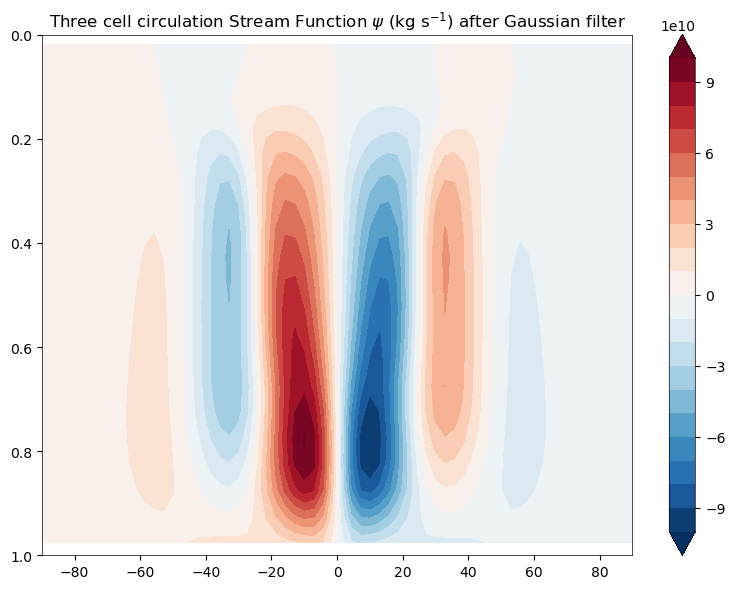

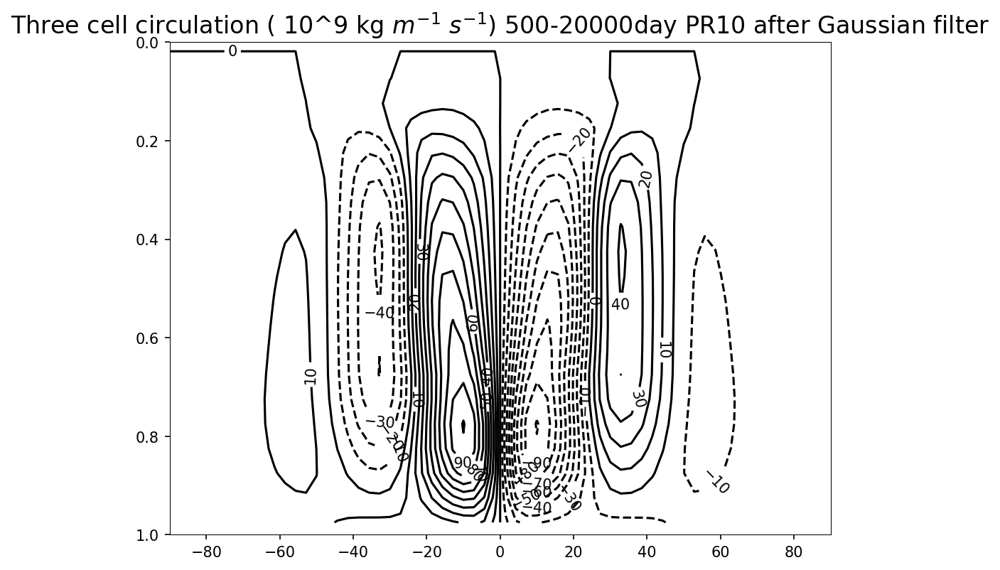

In [168]:
# a = 0
# tem = TEM_dp_Sukiyoung_fit_zonalmean_Three_cell_circulation(Vzm[a,:], Omega_zm[a,:], Pzm[a,:], PSzm[a,:], Tzm[a,:], Z_full_zm[a,:], TH_zm[a,:], v_prime[a,:], theta_prime[a,:], sigma_mean, total_pr, total_day, False)
# tem.process_and_plot()

# Fig.3 LH01 

In [51]:
EMF_file1      = h5py.File("PR10_50_500_20000day_EMF_origin_grid.h5", "r")
EMF_file0      = h5py.File("PR0_500_20000day_EMF_origin_grid.h5", "r")

EMF1       = np.asarray(EMF_file1["EMF"][:,:,:,:])
EMF0       = np.asarray(EMF_file0["EMF"][:,:,:,:])

EMF_oringin_grid = np.append(EMF0, EMF1, axis=0)

In [488]:
radius  = 6.37122e6
y = np.linspace(-90,90,64)
yd = np.deg2rad(y)
cy = np.cos(yd)
# cy [0] = np.nan
# cy [-1] = np.nan

dmdy = np.zeros((((6, 19500, 20, 64))))
print(dmdy.shape)
for a in range(6):
    Mzm = EMF_oringin_grid[a]
    for i in range(1,64-1):
        Mzm[:,:,i] = cy[i]**0.5 * Mzm[:,:,i]
    
    for i in range(1,64-1):
        dmdy[a,:,:,i] = -(Mzm[:,:,i+1] * (cy[i]**2) - Mzm[:,:,i-1]* (cy[i]**2)) / (radius * (cy[i]**2) * (yd[i+1] - yd[i-1]))
        # print(a * (yd[i+1]))
    dmdy[a,:,:, 0] = -(Mzm[:,:, 1]* (cy[i]**2) - Mzm[:,:, 0]* (cy[i]**2)) / (radius* cy[i]**2 *(yd[ 1] - yd[ 0]))
    dmdy[a,:,:,-1] = -(Mzm[:,:,-1]* (cy[i]**2) - Mzm[:,:,-2]* (cy[i]**2)) / (radius* cy[i]**2 *(yd[-1] - yd[-2]))

(6, 19500, 20, 64)


(1.0, 0.0)

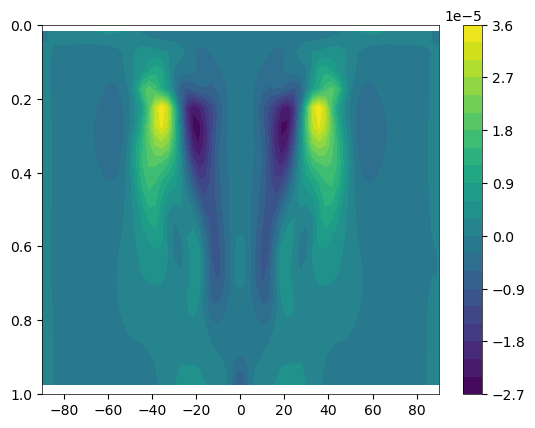

In [489]:
plt.figure()
plt.contourf(yy, sigma_mean2, np.nanmean(dmdy[0], axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])

In [53]:
# b_prime_file0      = h5py.File("PR0_500_20000day_b_prime.h5", "r")
# b_prime_file1      = h5py.File("PR10_50_500_20000day_b_prime.h5", "r")

# b_prime0       = np.asarray(b_prime_file0["b_prime"][:,:,:,:])
# b_prime1       = np.asarray(b_prime_file1["b_prime"][:,:,:,:])

# b_prime = np.append(b_prime0, b_prime1, axis=0)

In [54]:
# test_file = h5py.File("PR0_500_20000day_b_prime.h5", "r")
# b_prime  = np.asarray(test_file["b_prime"][:,:,:,:])


In [49]:
# # with h5py.File('PR0_500_20000day_N_square.h5','w') as N_square_file :
# #     N_square_file.create_dataset('N_square',data=N_square)
# N_square_file0      = h5py.File("PR0_500_20000day_N_square.h5", "r")
# N_square_file1      = h5py.File("PR10_50_500_20000day_N_square.h5", "r")

# N_square0       = np.asarray(N_square_file0["N_square"][:,:,:,:])
# N_square1       = np.asarray(N_square_file1["N_square"][:,:,:,:])

# N_square = np.append(N_square0, N_square1, axis=0)

In [55]:
# v_prime_file0      = h5py.File("PR0_500_20000day_v_prime.h5", "r")
# v_prime_file1      = h5py.File("PR10_50_500_20000day_v_prime.h5", "r")
# # theta_prime_file  = h5py.File("PR10_50_500_20000day_theta_prime.h5", "r")

# v_prime0     = np.asarray(v_prime_file0["v_prime"][:,:,:,:,:])
# v_prime1     = np.asarray(v_prime_file1["v_prime"][:,:,:,:,:])
# # theta_prime = np.asarray(theta_prime_file["theta_prime"][:,:,:,:,:])

# v_prime = np.append(v_prime0, v_prime1, axis=0)

In [ ]:
# N_square[N_square < 0] = 1E-5

In [ ]:
# MHF = np.zeros((((6, 19500, 20, 64))))
# for i in range(6):
#     MHF[i] = np.nanmean(v_prime[i] * b_prime[i], axis=3) / np.nanmean(N_square[i], axis=3) # np.nanmean(N_square_smoothed[i], axis=3)
# print(MHF.shape)

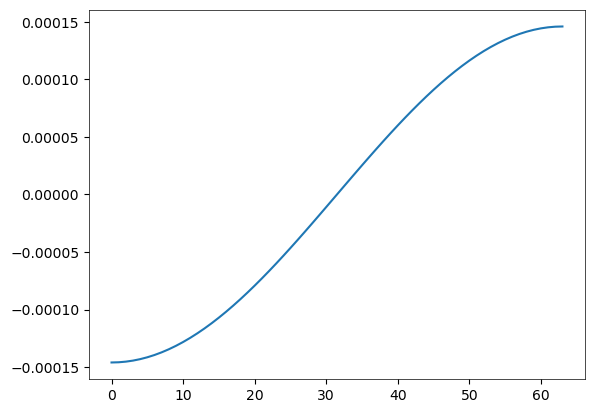

In [565]:
plt.figure()
plt.plot(f0)

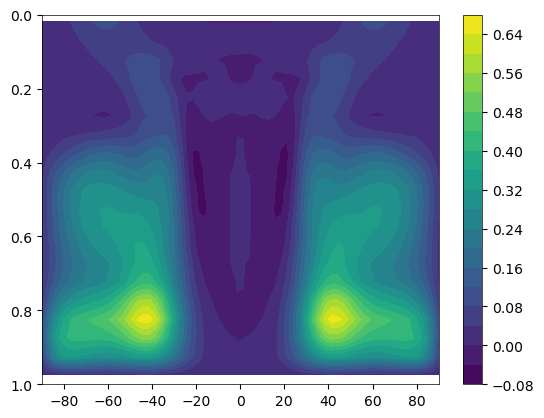

In [567]:
plt.figure()
plt.contourf(yy, sigma_mean2, f0*MHF[0].mean(axis=0), levels=21)
plt.ylim([1,0])
plt.colorbar()

In [576]:
print(dmdy.shape)

test = (vq_final[0] - (dmdy[0,:,:,32:] + f0[32:]*MHF[0,:,:,32:]))
print(test.max())
print(test.min())


(6, 19500, 20, 64)
4.172145336152674
-7.311228877292546


In [56]:
# with h5py.File('PR0_50_500_20000day_MHF_edited_1E_negative5.h5','w') as MHF_file :
#     MHF_file.create_dataset('MHF',data=MHF)
# print("MHF saving done! Remember to delete this cell!")

# MHF_file      = h5py.File("PR0_50_500_20000day_MHF.h5", "r")
# MHF     = np.asarray(MHF_file["MHF"][:,:,:,:])



In [577]:
MHF_file      = h5py.File("PR0_50_500_20000day_MHF_edited_1E_negative5.h5", "r")
MHF           = np.asarray(MHF_file["MHF"][:,:,:,:])

In [58]:
print(MHF.shape)
# print(

(6, 19500, 20, 64)


In [59]:
f0  = 2 * 7.292E-5 * np.sin(yd)

MHF_f  = np.zeros((((6, 19500, 20, 32)))) # mean meridional heat flux 
for a in range(6):
    for i in range(32):
        MHF_f[a,:,:,i] = MHF[a,:,:,i+32] * f0[i+32]

In [60]:
# str = "tmp_zonal_mean"
z_full_file1  = h5py.File("PR10_50_0_20000day_z_full.h5", "r")
# z_full_file2  = h5py.File("PR10_50_10000_20000day_z_full.h5", "r")

z_full1  = np.asarray(z_full_file1["z_full"][:,int(start):,:,:,:])
# z_full2  = np.asarray(z_full_file2["z_full"][:,:,:,:,:])

In [61]:
# z_full10_50 = np.append(z_full1, z_full2, axis=1)

In [62]:
z_full_file3  = h5py.File("PR0_0_20000day_z_full.h5", "r")
# z_full_file4  = h5py.File(str+"PR0_10000_20000day_z_full.h5", "r")

z_full3  = np.asarray(z_full_file3["z_full"][:,int(start):,:,:,:])
# z_full4  = np.asarray(z_full_file4["z_full"][:,:,:,:])

# z_full0 = np.append(z_full3, z_full4, axis=1)

In [63]:
z = np.append(z_full3, z_full1, axis=0)

In [64]:
print(z.shape)

(6, 19500, 20, 64, 128)


In [65]:
z_time_mean = np.nanmean(z, axis=1)

In [66]:
print(z_time_mean.shape)

(6, 20, 64, 128)


In [67]:
print(z_time_mean.shape)

(6, 20, 64, 128)


In [546]:
print(z.shape)

(6, 19500, 20, 64, 128)


In [ ]:
Zzm = np.nanmean(z, axis=4)

In [609]:
from datetime import datetime

now = datetime.now()

current_time = now.strftime("%D:%H:%M:%S")
print("Current Time =", current_time)

q2 = np.zeros((((6, 19500, 20, 32))))
for a in range(6):
    for k in range(19500):
        for i in range(1,20-1):
            q2[a,k,i,:] = (MHF[a,k,i+1,32:] - MHF[a,k,i-1,32:])  / (Zzm[a,k,i+1,32:]-Zzm[a,k,i-1,32:])
        q2[a,k,0,:]  = (MHF[a,k,1,32:] - MHF[a,k,0,32:])    / (Zzm[a,k,1,32:]  - Zzm[a,k,0,32:])
        q2[a,k,19,:] = (MHF[a,k,19,32:] - MHF[a,k,18,32:])  / (Zzm[a,k,19,32:] - Zzm[a,k,18,32:])
    print(a)

Current Time = 05/03/24:20:20:21
0
1
2
3
4
5


(6, 19500, 20, 64)
(6, 19500, 20, 64)
(6, 19500, 20, 64)
(6, 19500, 20, 64)


Text(0.5, 1.0, "500-20000 day $f_0 \\overline{v}^*$+$\\overline{v'q'}$ - dmdy - $f_0 \\overline{v}$")

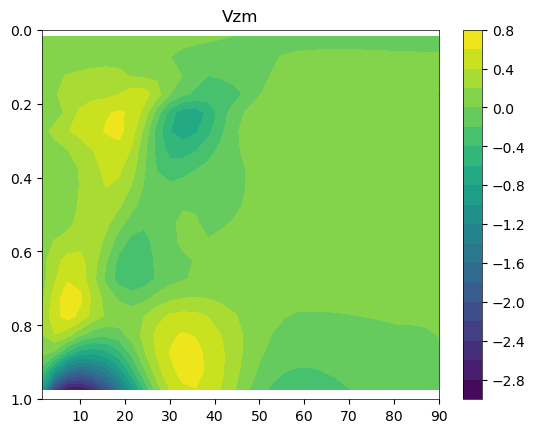

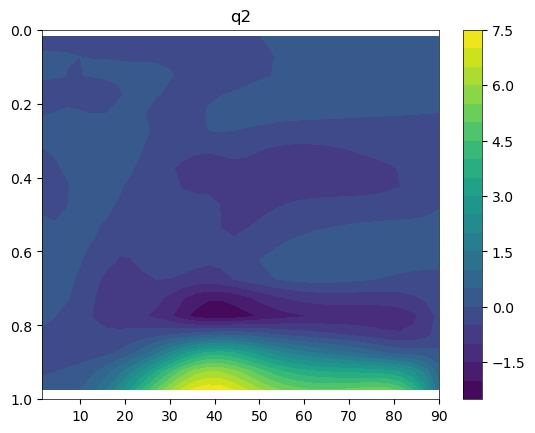

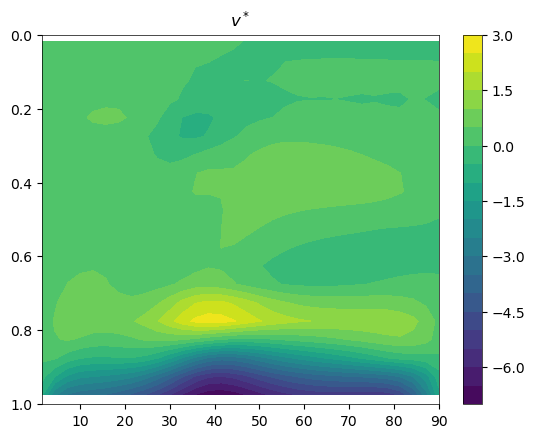

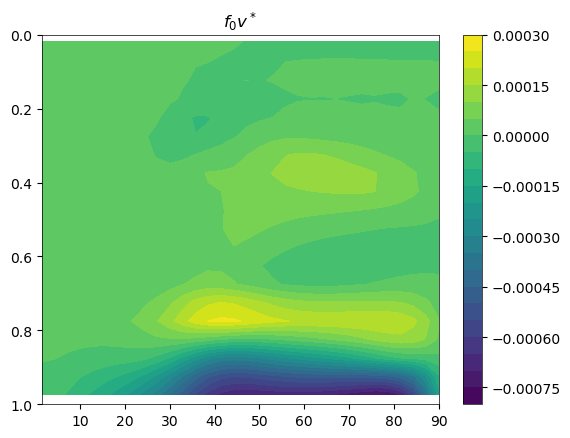

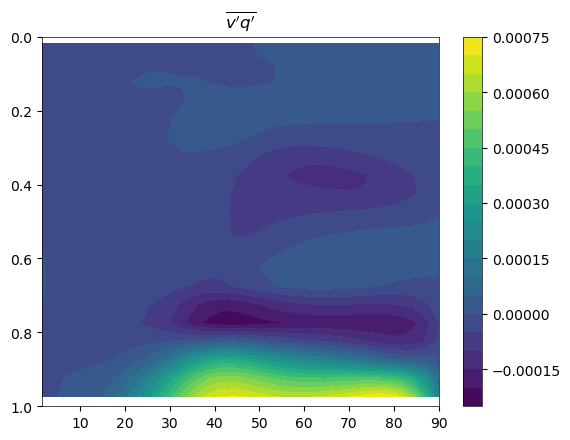

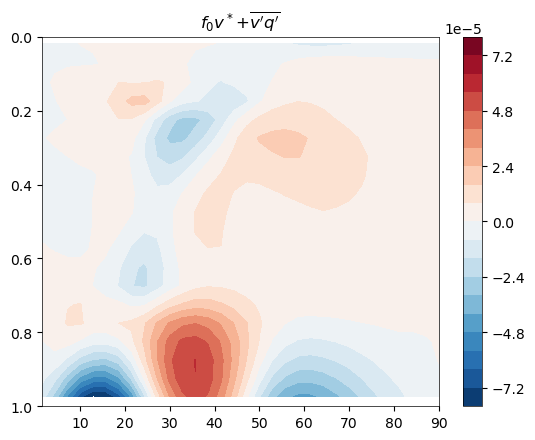

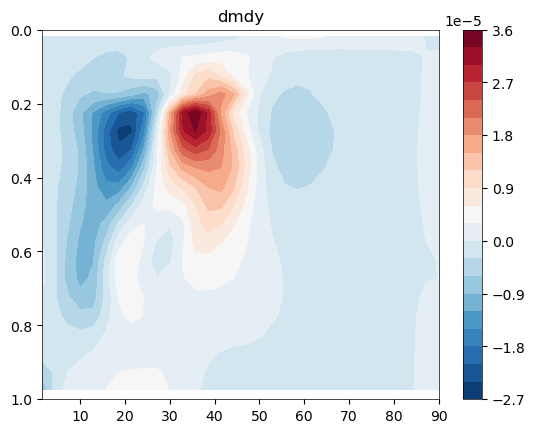

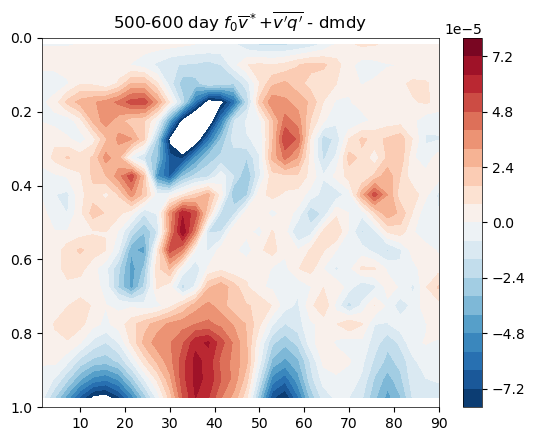

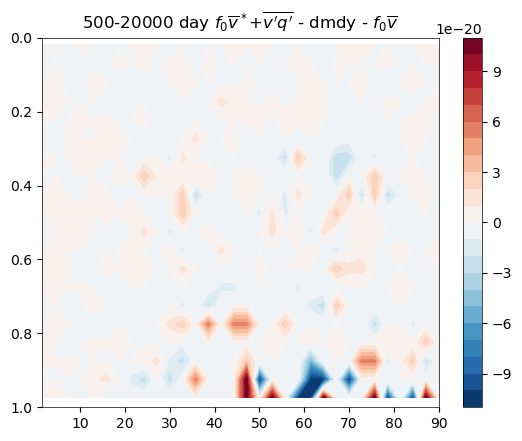

In [647]:
for a in range(6):
    v_star[a] = Vzm[a,:,:,32:] - q2[a]


plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], Vzm[0,:,:,32:].mean(axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("Vzm")
print(dmdy.shape)

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], q2[0,:,:,:].mean(axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("q2")
print(dmdy.shape)

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], v_star[0,:,:,:].mean(axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("$v^*$")
print(dmdy.shape)

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], f0[32:]*v_star[0].mean(axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("$f_0v^*$")
print(dmdy.shape)

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], np.nanmean(dmdy[0,:,:,32:] + f0[32:]*q2[0], axis=0), levels=21)
plt.colorbar()
plt.ylim([1,0])
plt.title("$\overline{v'q'}$")

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], f0[32:]*v_star[0].mean(axis=0) + np.nanmean(f0[32:]*q2[0] + dmdy[0,:,:,32:], axis=0), levels=np.linspace(-8E-5, 8E-5,21), cmap="RdBu_r")
plt.colorbar()
plt.ylim([1,0])
plt.title("$f_0v^*$+$\overline{v'q'}$")

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], np.nanmean(dmdy[0,:,:,32:], axis=0) , levels=21, cmap="RdBu_r")
plt.colorbar()
plt.ylim([1,0])
plt.title("dmdy")

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], f0[32:]*v_star[0,:1].mean(axis=0) + np.nanmean(f0[32:]*q2[0,:1] + dmdy[0,:1,:,32:]- dmdy[0,:1,:,32:], axis=0) , levels=np.linspace(-8E-5, 8E-5,21), cmap="RdBu_r")
plt.colorbar()
plt.ylim([1,0])
plt.title("500-600 day $f_0 \overline{v}^*$+$\overline{v'q'}$ - dmdy")

plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], f0[32:]*v_star[0,:1].mean(axis=0) + np.nanmean(f0[32:]*q2[0,:1] + dmdy[0,:1,:,32:]- dmdy[0,:1,:,32:] - f0[32:] * Vzm[0,:1,:,32:], axis=0)  , levels=21, cmap="RdBu_r")
plt.colorbar()
plt.ylim([1,0])
plt.title("500-20000 day $f_0 \overline{v}^*$+$\overline{v'q'}$ - dmdy - $f_0 \overline{v}$")

In [666]:
day = 19500
# vq = EMF + 
vq_final = f0[32:]*q2 + dmdy[:,:,:,32:]
print(vq_final.shape)
vq_final_reshape = np.zeros((((6,day,20*32))))
vq_final_sm_minus = np.zeros(vq_final_reshape.shape)
for a in range(6):
    vq_final_reshape[a] = np.reshape(vq_final[a],(day,20*32))

    # vq_final_sm_mean[a]  = np.nanmean(vq_final_reshape[a], axis=0)
    # vq_final_sm_minus[a] = vq_final_reshape[a] - vq_final_sm_mean[a]

(6, 19500, 20, 32)


In [667]:
a = 0
test = np.nanmean(dmdy[a,:,:,32:]  - (f0v_star[a]+ f0[32:]*q2[a] + dmdy[a,:,:,32:]), axis=1)  # * np.nanmean(Vzm[a,:,:,32:], axis=1)#
plt.figure()
plt.plot(test[:,5])
plt.title(" The difference between EMF div and f0v_star+v'q' ")
print("max difference:", test[:,:].max())
print("min difference:", test[:,:].min())


ValueError: operands could not be broadcast together with shapes (19500,32) (19500,20,32) 

In [668]:
# with h5py.File('PR0_50_500_20000day_vq.h5','w') as vq_file :
    # vq_file.create_dataset('vq',data=vq_final)

In [669]:
print(z_time_mean.shape)

(6, 20, 64, 128)


In [73]:
# VHF = np.zeros((((6, 19500, 20, 32)))) # vertical heat flux
# for a in range(6):
#     for i in range(1,20-1):
#         VHF[a,:,i,:] = (MHF[a,:,i+1,32:] - MHF[a,:,i-1,32:])  / np.nanmean(z[a,:,i+1,32:,:]-z[a,:,i-1,32:,:], axis=(0,2))

In [520]:
print(Vzm.shape)
print(q2.shape)
print(v_star.shape)

(6, 19500, 20, 64)
(6, 19500, 20, 32)
(6, 19500, 20, 32)


In [533]:
day = 19500
f0v_star = np.zeros((((6,day,20,32))))
f0v_star_reshape = np.zeros(((6,day,20*32)))
m_right = np.zeros(((6,day,20*32)))

for a in range(6):
    for i in range(32):
        f0v_star[a,:,:,i] = v_star[a,:,:,i] * f0[i+32]
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,20*32))
# f0v_star_minus   = f0v_star_reshape - np.nanmean(f0v_star_reshape, axis=0)
    m_right[a] = f0v_star_reshape[a] + vq_final_reshape[a]
    # print(m_right.shape)

m_right_final = np.zeros(m_right.shape)
for a in range(6):
    m_right_final[a] = m_right[a] - np.nanmean(m_right[a], axis=0)

# m right final done
# print(m_right[1])

In [68]:
print(Uzm.shape)
cy = np.cos(yd)
print(cy**0.5)

(6, 19500, 20, 64)
[7.82510958e-09 2.23261922e-01 3.15543732e-01 3.86059926e-01
 4.45136095e-01 4.96746814e-01 5.42913598e-01 5.84824883e-01
 6.23245374e-01 6.58698519e-01 6.91559093e-01 7.22104704e-01
 7.50546506e-01 7.77048525e-01 8.01740363e-01 8.24725856e-01
 8.46089150e-01 8.65899072e-01 8.84212351e-01 9.01076027e-01
 9.16529281e-01 9.30604859e-01 9.43330170e-01 9.54728156e-01
 9.64817987e-01 9.73615605e-01 9.81134164e-01 9.87384379e-01
 9.92374805e-01 9.96112045e-01 9.98600920e-01 9.99844579e-01
 9.99844579e-01 9.98600920e-01 9.96112045e-01 9.92374805e-01
 9.87384379e-01 9.81134164e-01 9.73615605e-01 9.64817987e-01
 9.54728156e-01 9.43330170e-01 9.30604859e-01 9.16529281e-01
 9.01076027e-01 8.84212351e-01 8.65899072e-01 8.46089150e-01
 8.24725856e-01 8.01740363e-01 7.77048525e-01 7.50546506e-01
 7.22104704e-01 6.91559093e-01 6.58698519e-01 6.23245374e-01
 5.84824883e-01 5.42913598e-01 4.96746814e-01 4.45136095e-01
 3.86059926e-01 3.15543732e-01 2.23261922e-01 7.82510958e-09]


In [69]:
print(v_star.shape)

(6, 19500, 20, 32)


In [70]:
print(z.shape)

(6, 19500, 20, 64, 128)


In [71]:
from scipy.fftpack import fftfreq
from scipy.fft import fft, ifft

97.5


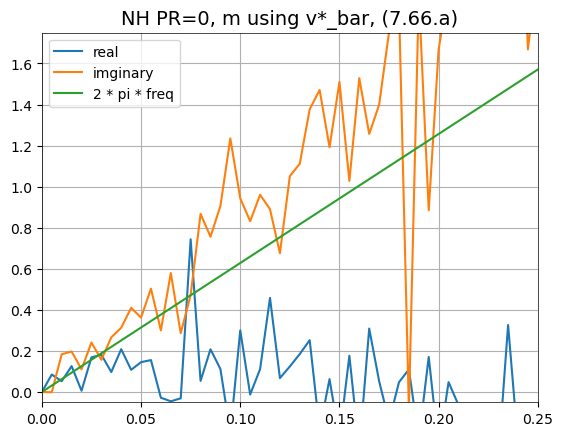

97.5


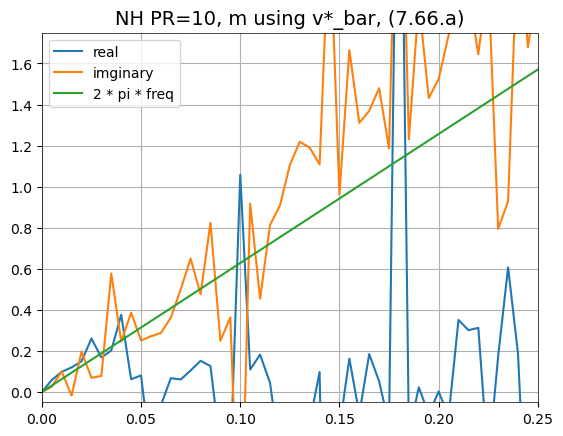

97.5


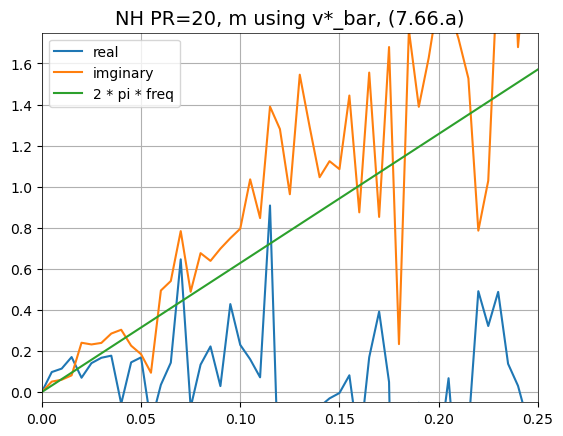

97.5


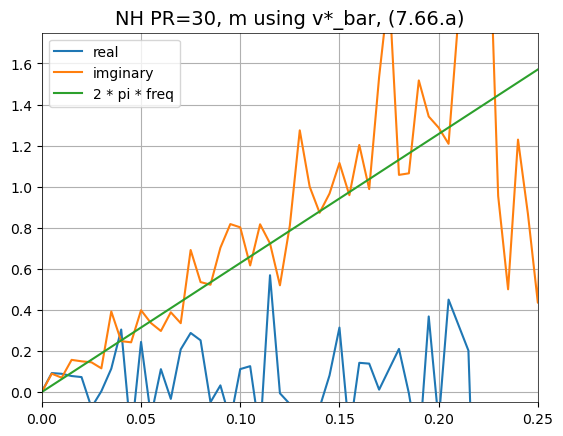

97.5


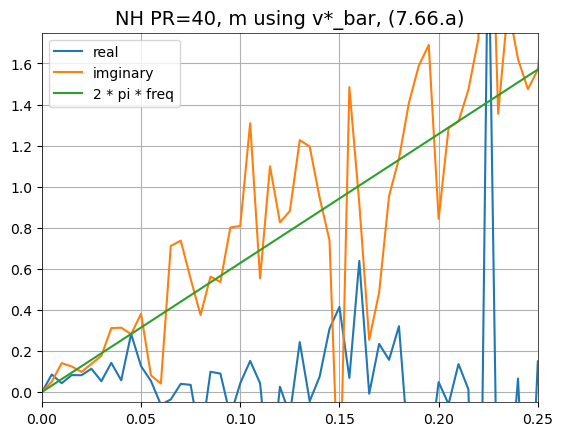

97.5


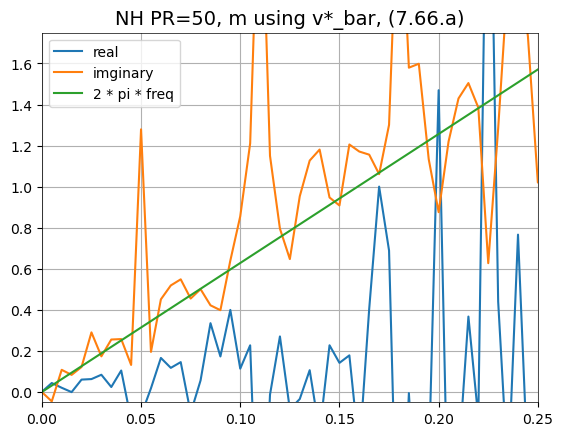

In [72]:
"""
(20, 32) didn't vertical integraiton
"""
# plot for check whether I got correct EOF and PC, 
# so I project(do dot) EOF on PC to test if I would go back to original u wind.
u_50_new = np.zeros(((6, 19500, 20*32)))
# Before EOF, we need to normalize final_m_term
u_50   = Uzm[:,:,:,32:] # dycore.getVar("grid_u_c_xyzt")
u_50_w = np.zeros(u_50.shape)
for a in range(6):
    for i in range(32-1): # cy[0] and [-1] are np.nan
        u_50_w[a,:,:,i] = u_50[a,:,:,i] * (cy[i+32])**0.5
    # u_50_w2   = np.nanmean(u_50_w[:,:,:], axis=(3))
    u_50_new[a]  = np.reshape(u_50_w[a], (day, 20*32))

    single_EOF_50 = EOF((u_50_new[a],), n_components=640, field="1D")
    single_EOF_50.get()
    
    z_paper       = (single_EOF_50.PC[0,:])
    EOF_try       = (single_EOF_50.EOF[0,:])
    
    z_paper_std   = z_paper.std()
    z_paper_final = z_paper / z_paper_std 

    
    EOF_std = EOF_try.std()
    EOF_try = EOF_try * z_paper_std 
    EOF_back = np.reshape(EOF_try, (20,32))
    
    f0v_star = np.zeros((((6,day,20,32))))
    f0v_star_reshape = np.zeros(((6, day, 20*32)))
    f0v_star_minus = np.zeros(f0v_star_reshape.shape)

# for a in range(6):
    for i in range(32):
        f0v_star[a,:,:,i] = v_star[a,:,:,i] * f0[i+32]
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,20*32))
    f0v_star_minus[a]   = f0v_star_reshape[a] - np.nanmean(f0v_star_reshape[a], axis=0)

    m_right[a] = f0v_star_reshape[a] + vq_final_reshape[a]
    m_right_final[a] = m_right[a] - np.nanmean(m_right[a], axis=0)
    
    m = np.zeros(day)
    for i in range(day):
        m[i] = np.nansum(EOF_try[2:-2]*m_right_final[a,i,2:-2].T)
    
    m_std   = m.std()
    m_final = m / m_std
    
    # Do not take the all time series to do FFT,
    # there would be offset. So I'm gotta to take the small time interval to do FFT, 
    # which are overlap (because after FFT, there would be a pulse at both ends of the spectrum space.
    lg      = 200 # length of interval 
    Z_sum   = np.zeros(lg, dtype = complex)
    M_sum   = np.zeros(lg, dtype = complex)
    
    for i in range(0 , len(z_paper), lg):
        if i == 0:
            aa = i
            Z_sum += fft(z_paper_final[0:aa+lg])  / len(z_paper_final[0:aa+lg])     #要除以資料長度
            M_sum += fft(m_final[0:aa+lg])  / len(m_final[0:aa+lg])
        else:
            aa = int(i-100)               
            Z_sum += fft(z_paper_final[aa:aa+lg]) / len(z_paper_final[aa:aa+lg])    #要除以資料長度
            M_sum += fft(m_final[aa:aa+lg]) / len(m_final[aa:aa+lg])
            # print(np.nanmin(Z_sum))
    
    print((len(z_paper) / lg))
    Z = Z_sum / (len(z_paper) / lg)
    M = M_sum / (len(m) / lg)
    # print(Z_final)
    
    freq   = fftfreq(Z.shape[0])
    idx    = np.argsort(freq)
    
    M_star = np.conjugate(M)
    Z_star = np.conjugate(Z)
    
    final  = (Z_star * M) / (Z_star * Z)
    
    kk     = -1  #int(lg)
    ll     = 0   #int(lg/2-2)
    plt.figure(dpi=100.)
    plt.ylim([-0.05,1.75])
    plt.xlim([0,0.25])
    
    plt.title(f"NH PR={a*10}, m using v*_bar, (7.66.a)", fontsize=14)
    plt.plot(freq[idx][ll:kk], (final[idx][ll:kk]).real / np.pi, label="real")
    plt.plot(freq[idx][ll:kk], (final[idx][ll:kk]).imag / np.pi, label="imginary")
    plt.plot(freq[idx][ll:kk], (freq[idx][ll:kk]) * 2 * np.pi, label="2 * pi * freq")
    
    # plt.xlim([-0.25, 0.25])
    # plt.ylim([-3,3])
    plt.grid()
    plt.legend()
    # plt.savefig(r"paper1_fig/eq(7.66a)_fig/RH50_PR10//800day_Global_v*_cross_spectrum.png", bbox_inches='tight', dpi=600.)
    plt.show()

(19500,)


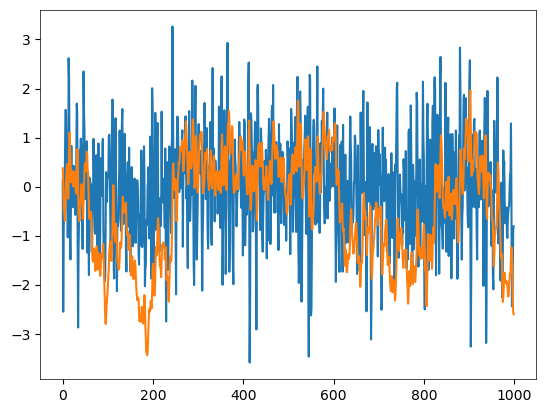

In [73]:
plt.figure()
plt.plot(m_final[-1000:])
plt.plot(z_paper_final[-1000:])
print(m_final.shape)

In [74]:
print(Z_sum)

[-2.80753712e+01+0.00000000e+00j  1.37598507e+00-2.57824091e-01j
  1.06533350e+00+7.83771886e-01j -1.79357814e-01+1.03254460e+00j
 -8.81928813e-01+1.08853609e+00j  1.91738614e-01-7.65031759e-01j
  3.28313363e-01-1.02719966e+00j  3.14217651e-01+5.43716561e-01j
 -5.57951312e-01-7.24764284e-02j -1.02641321e-01+1.56554167e-01j
  5.28563715e-02-3.77878240e-02j -2.16819729e-01+3.17593728e-01j
  2.01566606e-01+5.17654114e-01j  4.94008098e-01+4.88072382e-01j
 -3.25323984e-01-2.16785007e-01j  2.91772082e-01-5.80782611e-01j
  3.90817421e-01-4.55882044e-01j  2.69867430e-01+9.78562231e-02j
  8.95051445e-02+3.82979214e-01j -2.01162189e-01-7.92637780e-02j
 -2.01409251e-01+2.39308679e-01j  3.98526599e-03+7.70609955e-02j
 -2.36664291e-02-1.71849192e-02j  1.48630619e-01+3.06969021e-01j
 -3.64283304e-01+7.20944322e-02j -1.64026905e-01-1.76597582e-01j
 -3.38343021e-01-2.40295617e-01j  3.33836195e-01-1.83020708e-01j
 -2.40318595e-01+2.45577261e-01j -1.02552307e-01+2.32465216e-01j
 -1.19949803e-02-9.324408

(640,)


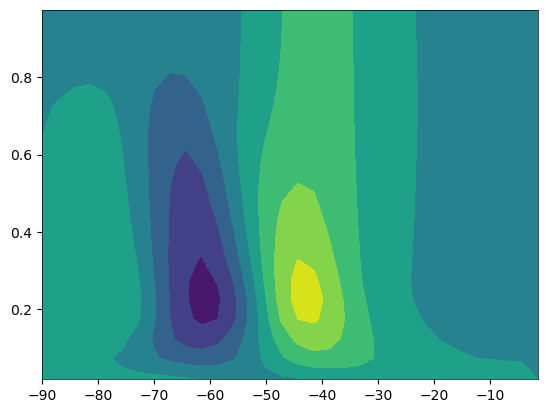

In [75]:
print(EOF_try.shape)

hi = np.reshape(EOF_try, (20,32))
plt.figure()
plt.contourf(yy[:,:32], sigma_mean2[:,:32], hi)
# plt.plot(z_paper_final[19000:])


In [203]:
print(MHF.shape)

(6, 19500, 20, 64)


Text(0.5, 1.0, "$\\partial (f_0 * \\overline{v'b'} / N^2) / \\partial z$")

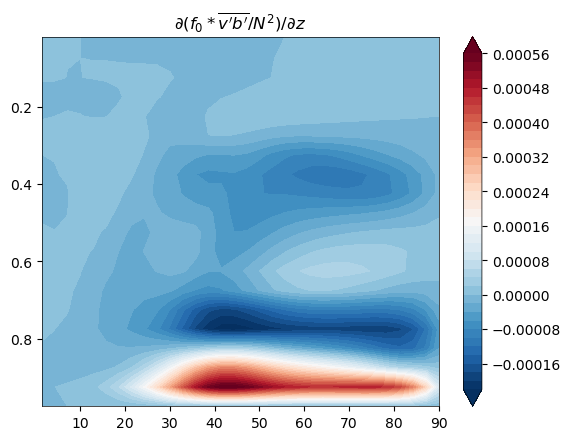

In [211]:

plt.figure()
# plt.yscale('log')
plt.gca().invert_yaxis()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], np.mean(q2[0], axis=0), levels=51, cmap="RdBu_r", extend="both")
# CT = plt.contour(yy, sigma_mean2,  np.nanmean(q2[-1]+ dmdy[-1], axis=0) ,[0.0], colors='k')
plt.colorbar()
plt.title("$\partial (f_0 * \overline{v'b'} / N^2) / \partial z$")

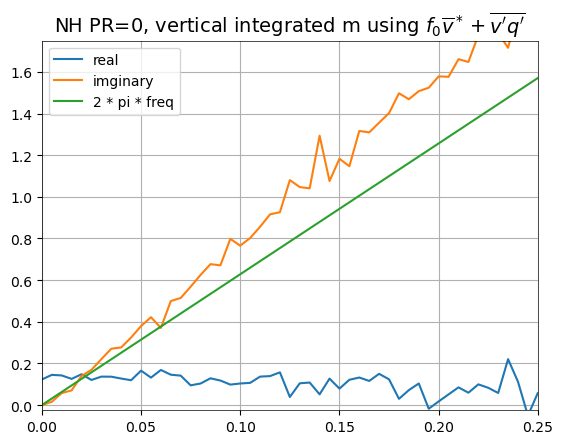

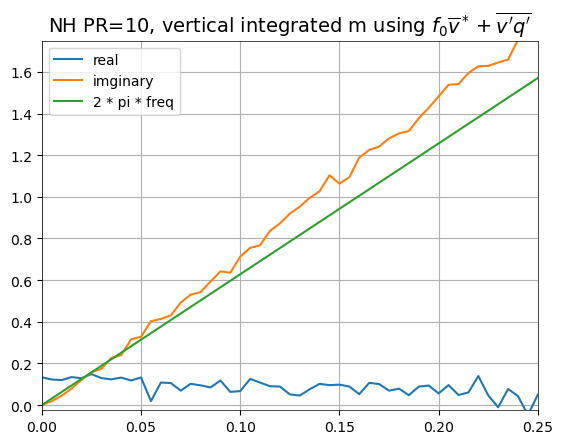

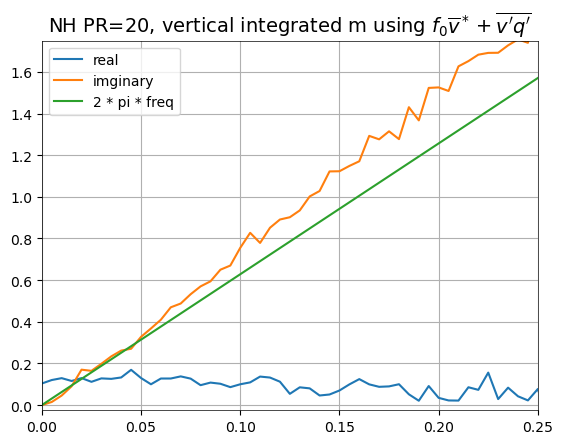

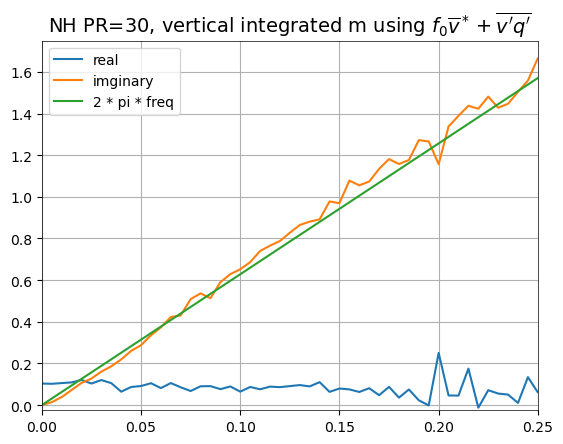

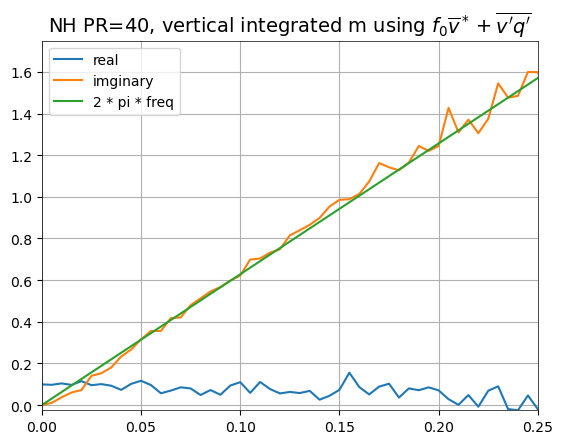

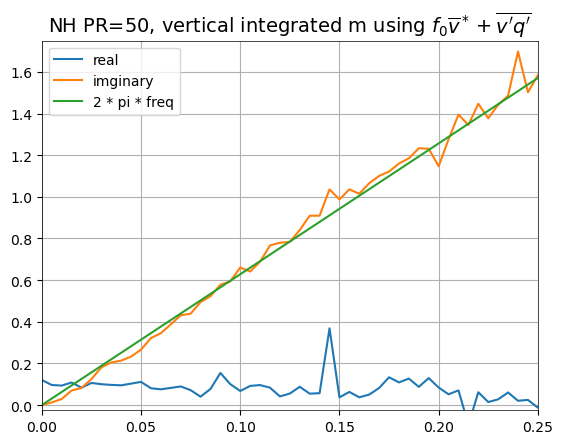

In [76]:
"""
(32) did vertical integraiton
"""
from EOF import EOF
day = 19500
num_exp = 6
num_lat = 32
f0v_star = np.zeros(((num_exp,day,num_lat)))
f0v_star_reshape = np.zeros(((num_exp,day,num_lat)))
m_right = np.zeros(((num_exp,day,num_lat)))

for a in range(num_exp):
    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat]
    m_right[a] = f0v_star[a] + np.nanmean(vq_final[a], axis=1) 

m_right_final = (m_right)
##########################################################################
u_50_new = np.zeros(((num_exp, day, num_lat)))

# vertical integration
u_50   = np.nanmean(Uzm[:,:,:,num_lat:], axis=2) # dycore.getVar("grid_u_c_xyzt")
u_50_w = np.zeros(u_50.shape)

# fig, ax = plt.subplots(3,6, figsize=(25,13), dpi=300.)

for a in range(num_exp):
    for i in range(num_lat-1): # cy[0] and [-1] are np.nan
        u_50_w[a,:,i] = u_50[a,:,i] * (cy[i+num_lat])**0.5

    single_EOF_50 = EOF((u_50_w[a],), n_components=num_lat, field="1D")
    single_EOF_50.get()
    
    z_paper       = (single_EOF_50.PC[0,:])
    EOF_try       = (single_EOF_50.EOF[0,:])
    
    z_paper_std   = z_paper.std()
    z_paper_final = z_paper / z_paper_std 

    EOF_std = EOF_try.std()
    EOF_try = EOF_try * z_paper_std 
    
    f0v_star = np.zeros(((num_exp,day,num_lat)))
    f0v_star_reshape = np.zeros(((num_exp, day, num_lat)))
    # f0v_star_minus = np.zeros(f0v_star_reshape.shape)

    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat] # do vertical integration
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,num_lat))
    # f0v_star_minus[a]   = f0v_star_reshape[a] - np.nanmean(f0v_star_reshape[a], axis=0)

    m = np.dot(EOF_try[:], m_right_final[a,:,:].T)
    
    m_std   = m.std()
    m_final = (m - m.mean()) / m_std

    lg      = 200 # length of the interval
    overlap = 100 # overlap

    final_all  = np.zeros(lg, dtype=complex)
    n_segments = 0  # Keep track of the number of segments processed

    for i in range(0, len(z_paper) - lg + 1, lg - overlap):
        hanning_window = np.hanning(lg)
        Z_segment = fft(z_paper_final[i:i+lg] * hanning_window)
        M_segment = fft(m_final[i:i+lg] * hanning_window)

        M_star = np.conjugate(M_segment)
        Z_star = np.conjugate(Z_segment)

        # Compute the cross-spectrum
        final      = (Z_star * M_segment) / (Z_star * Z_segment)
        final_all += final
        
        n_segments += 1

    final_all /= len(final_all)
    
    # Compute the frequencies for plotting
    freq = fftfreq(lg, d=1)  # Assuming your time unit is days
    idx = np.argsort(freq)
    
    
    kk     = -1  
    ll     = 0   

    plt.figure(dpi=100.)
    plt.title(f"NH PR={a*10}, vertical integrated m using"+r" $f_{0} \overline{v}^* + \overline{v'q'}$", fontsize=14)
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).real / np.pi, label="real")
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).imag / np.pi, label="imginary")
    plt.plot(freq[idx][ll:kk], (freq[idx][ll:kk]) * 2 * np.pi, label="2 * pi * freq")
    
    plt.xlim([0, 0.25])
    plt.ylim([-0.025,1.75])
    plt.grid()
    plt.legend()
    # plt.savefig(r"paper1_fig/eq(7.66a)_fig/RH50_PR10//800day_Global_v*_cross_spectrum.png", bbox_inches='tight', dpi=600.)
    plt.show()




TypeError: 'Axes' object is not subscriptable

In [1]:
"""
(32) did vertical integraiton
"""
from EOF import EOF
day = 19500
num_exp = 6
num_lat = 32
f0v_star = np.zeros(((num_exp,day,num_lat)))
f0v_star_reshape = np.zeros(((num_exp,day,num_lat)))
m_right = np.zeros(((num_exp,day,num_lat)))

for a in range(num_exp):
    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat]
    m_right[a] = f0v_star[a] #+ np.nanmean(vq_final[a], axis=1) 

m_right_final = (m_right)
##########################################################################
u_50_new = np.zeros(((num_exp, day, num_lat)))

# vertical integration
u_50   = np.nanmean(Uzm[:,:,:,num_lat:], axis=2) # dycore.getVar("grid_u_c_xyzt")
u_50_w = np.zeros(u_50.shape)

# fig, ax = plt.subplots(3,6, figsize=(25,13), dpi=300.)

for a in range(num_exp):
    for i in range(num_lat-1): # cy[0] and [-1] are np.nan
        u_50_w[a,:,i] = u_50[a,:,i] * (cy[i+num_lat])**0.5

    single_EOF_50 = EOF((u_50_w[a],), n_components=num_lat, field="1D")
    single_EOF_50.get()
    
    z_paper       = (single_EOF_50.PC[0,:])
    EOF_try       = (single_EOF_50.EOF[0,:])
    
    z_paper_std   = z_paper.std()
    z_paper_final = z_paper / z_paper_std 

    EOF_std = EOF_try.std()
    EOF_try = EOF_try * z_paper_std 
    
    f0v_star = np.zeros(((num_exp,day,num_lat)))
    f0v_star_reshape = np.zeros(((num_exp, day, num_lat)))
    # f0v_star_minus = np.zeros(f0v_star_reshape.shape)

    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat] # do vertical integration
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,num_lat))
    # f0v_star_minus[a]   = f0v_star_reshape[a] - np.nanmean(f0v_star_reshape[a], axis=0)

    m = np.dot(EOF_try[:], m_right_final[a,:,:].T)
    
    m_std   = m.std()
    m_final = (m - m.mean()) / m_std

    lg      = 200 # length of the interval
    overlap = 100 # overlap

    final_all  = np.zeros(lg, dtype=complex)
    n_segments = 0  # Keep track of the number of segments processed

    for i in range(0, len(z_paper) - lg + 1, lg - overlap):
        hanning_window = np.hanning(lg)
        Z_segment = fft(z_paper_final[i:i+lg] * hanning_window)
        M_segment = fft(m_final[i:i+lg] * hanning_window)

        M_star = np.conjugate(M_segment)
        Z_star = np.conjugate(Z_segment)

        # Compute the cross-spectrum
        final      = (Z_star * M_segment) / (Z_star * Z_segment)
        final_all += final
        
        n_segments += 1

    final_all /= len(final_all)
    
    # Compute the frequencies for plotting
    freq = fftfreq(lg, d=1)  # Assuming your time unit is days
    idx = np.argsort(freq)
    
    
    kk     = -1  
    ll     = 0   

    plt.figure(dpi=100.)
    plt.title(f"NH PR={a*10}, vertical integrated m using"+r" $f_{0} \overline{v}^* $", fontsize=14)
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).real / np.pi, label="real")
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).imag / np.pi, label="imginary")
    plt.plot(freq[idx][ll:kk], (freq[idx][ll:kk]) * 2 * np.pi, label="2 * pi * freq")
    
    plt.xlim([0, 0.25])
    plt.ylim([-0.025,1.75])
    plt.grid()
    plt.legend()
    # plt.savefig(r"paper1_fig/eq(7.66a)_fig/RH50_PR10//800day_Global_v*_cross_spectrum.png", bbox_inches='tight', dpi=600.)
    plt.show()




NameError: name 'np' is not defined

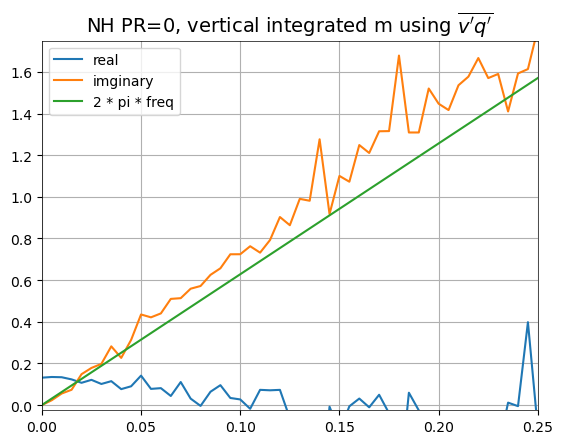

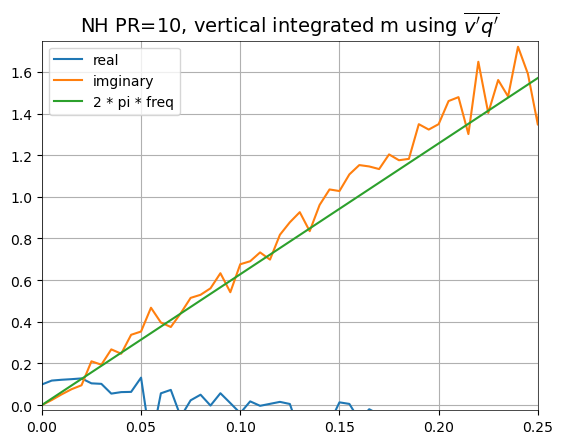

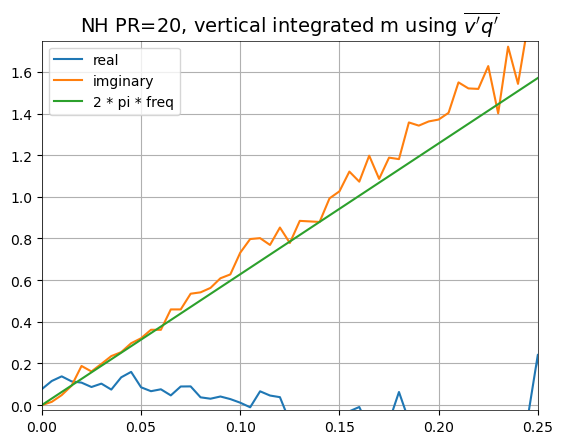

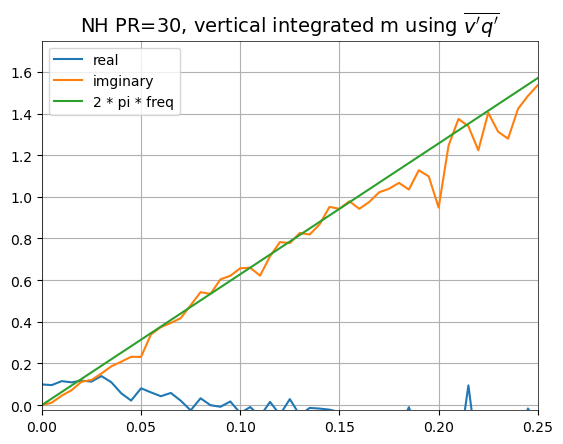

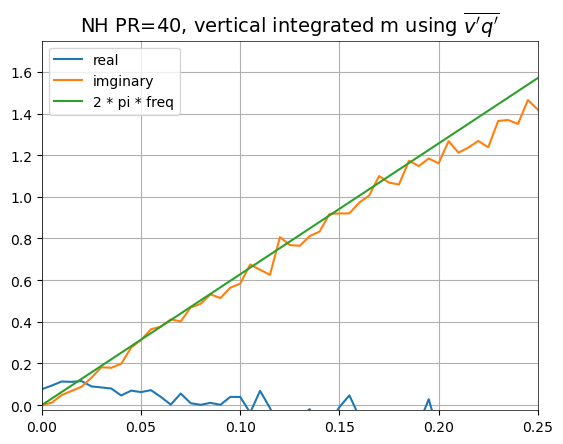

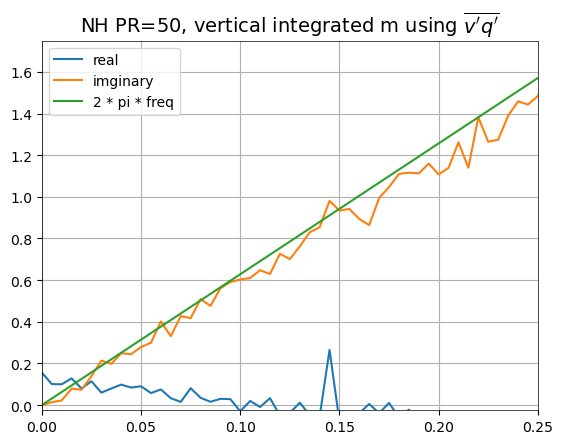

In [1042]:
"""
(32) did vertical integraiton
"""
from EOF import EOF
day = 19500
num_exp = 6
num_lat = 32
f0v_star = np.zeros(((num_exp,day,num_lat)))
f0v_star_reshape = np.zeros(((num_exp,day,num_lat)))
m_right = np.zeros(((num_exp,day,num_lat)))

for a in range(num_exp):
    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat]
    m_right[a] =  np.nanmean(vq_final[a], axis=1) # f0v_star[a] + 

m_right_final = (m_right)
##########################################################################
u_50_new = np.zeros(((num_exp, day, num_lat)))

# vertical integration
u_50   = np.nanmean(Uzm[:,:,:,num_lat:], axis=2) # dycore.getVar("grid_u_c_xyzt")
u_50_w = np.zeros(u_50.shape)

# fig, ax = plt.subplots(3,6, figsize=(25,13), dpi=300.)

for a in range(num_exp):
    for i in range(num_lat-1): # cy[0] and [-1] are np.nan
        u_50_w[a,:,i] = u_50[a,:,i] * (cy[i+num_lat])**0.5

    single_EOF_50 = EOF((u_50_w[a],), n_components=num_lat, field="1D")
    single_EOF_50.get()
    
    z_paper       = (single_EOF_50.PC[0,:])
    EOF_try       = (single_EOF_50.EOF[0,:])
    
    z_paper_std   = z_paper.std()
    z_paper_final = z_paper / z_paper_std 

    EOF_std = EOF_try.std()
    EOF_try = EOF_try * z_paper_std 
    
    f0v_star = np.zeros(((num_exp,day,num_lat)))
    f0v_star_reshape = np.zeros(((num_exp, day, num_lat)))
    # f0v_star_minus = np.zeros(f0v_star_reshape.shape)

    for i in range(num_lat):
        f0v_star[a,:,i] = np.nanmean(v_star[a,:,:,i], axis=1) * f0[i+num_lat] # do vertical integration
    f0v_star_reshape[a] = np.reshape(f0v_star[a], (day,num_lat))
    # f0v_star_minus[a]   = f0v_star_reshape[a] - np.nanmean(f0v_star_reshape[a], axis=0)

    m = np.dot(EOF_try[:], m_right_final[a,:,:].T)
    
    m_std   = m.std()
    m_final = (m - m.mean()) / m_std

    lg      = 200 # length of the interval
    overlap = 100 # overlap

    final_all  = np.zeros(lg, dtype=complex)
    n_segments = 0  # Keep track of the number of segments processed

    for i in range(0, len(z_paper) - lg + 1, lg - overlap):
        hanning_window = np.hanning(lg)
        Z_segment = fft(z_paper_final[i:i+lg] * hanning_window)
        M_segment = fft(m_final[i:i+lg] * hanning_window)

        M_star = np.conjugate(M_segment)
        Z_star = np.conjugate(Z_segment)

        # Compute the cross-spectrum
        final      = (Z_star * M_segment) / (Z_star * Z_segment)
        final_all += final
        
        n_segments += 1

    final_all /= len(final_all)
    
    # Compute the frequencies for plotting
    freq = fftfreq(lg, d=1)  # Assuming your time unit is days
    idx = np.argsort(freq)
    
    
    kk     = -1  
    ll     = 0   

    plt.figure(dpi=100.)
    plt.title(f"NH PR={a*10}, vertical integrated m using"+r" $\overline{v'q'}$", fontsize=14)
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).real / np.pi, label="real")
    plt.plot(freq[idx][ll:kk], (final_all[idx][ll:kk]).imag / np.pi, label="imginary")
    plt.plot(freq[idx][ll:kk], (freq[idx][ll:kk]) * 2 * np.pi, label="2 * pi * freq")
    
    plt.xlim([0, 0.25])
    plt.ylim([-0.025,1.75])
    plt.grid()
    plt.legend()
    # plt.savefig(r"paper1_fig/eq(7.66a)_fig/RH50_PR10//800day_Global_v*_cross_spectrum.png", bbox_inches='tight', dpi=600.)
    plt.show()




# test Fig.3 

(19500, 32)


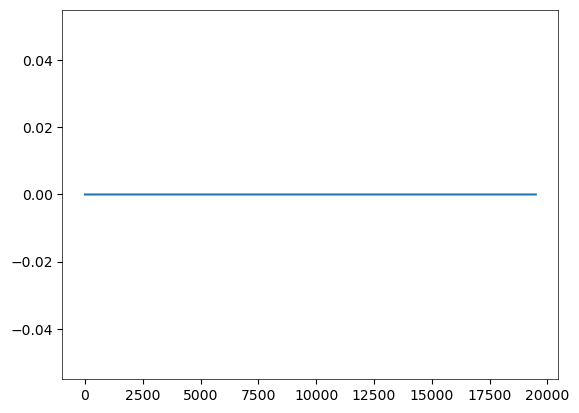

In [660]:
a = 0
test = (f0v_star[a] + np.nanmean(vq_final[a]- dmdy[a,:,:,32:], axis=1) )
print(test.shape)
plt.figure()
plt.plot(test[:,10])

(6, 19500, 20, 32)


(1.0, 0.0)

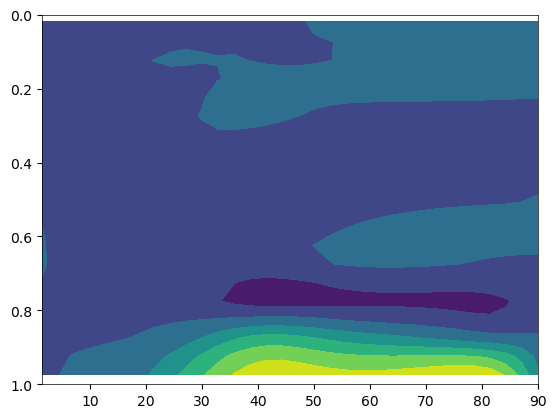

In [670]:
plt.figure()
print(vq_final.shape)
plt.contourf(yy[:,32:], sigma_mean2[:,32:], vq_final[0].mean(axis=0))
plt.ylim([1,0])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[1.47794929e-06 2.10339243e-06 2.17088890e-06 2.37841549e-06
 2.88539460e-06 3.13572137e-06 3.46799963e-06 3.87260667e-06
 4.14423279e-06 4.15429831e-06 4.62393163e-06 4.58927551e-06
 5.15168705e-06 5.53608390e-06 5.76571190e-06 6.52157892e-06
 6.40146573e-06 6.98475997e-06 6.99471484e-06 7.33213374e-06
 7.70746265e-06 8.16197561e-06 8.17929334e-06 8.41374888e-06
 8.72530993e-06 9.13460838e-06 9.76632283e-06 9.95425575e-06
 1.03900069e-05 9.75462904e-06 1.06723270e-05 1.09983590e-05
 1.10751044e-05 1.14382117e-05 1.15736876e-05 1.21722507e-05
 1.25947411e-05 1.28814928e-05 1.25711260e-05 1.29370561e-05
 1.32943241e-05 1.42948936e-05 1.35484493e-05 1.37252249e-05
 1.44448208e-05 1.43348916e-05 1.58273732e-05 1.52964402e-05
 1.57849925e-05 1.65711445e-05 1.69128120e-05 1.58827146e-05
 1.72685160e-05 1.65264740e-05 1.79100000e-05 1.82755037e-05
 1.81771633e-05 1.79743511e-05 1.98719416e-05 1.92897638e-05
 1.87108181e-05 1.92138514e-05 2.00528667e-05 1.94595490e-05
 1.92744329e-05 1.806995

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[1.41253479e-06 1.58016663e-06 1.79170418e-06 2.01461305e-06
 2.19591418e-06 2.34353289e-06 2.47354736e-06 2.67049779e-06
 2.96559725e-06 3.24111013e-06 3.40278842e-06 3.52675923e-06
 3.67949803e-06 3.92007926e-06 4.03060262e-06 4.37948840e-06
 4.41295388e-06 4.56962066e-06 4.98009525e-06 5.21291966e-06
 5.25214261e-06 5.59559486e-06 5.65235641e-06 6.13768739e-06
 6.38057096e-06 6.59440023e-06 6.98391682e-06 6.97341393e-06
 7.20125980e-06 7.24237775e-06 7.35709647e-06 7.71858015e-06
 7.92823033e-06 7.91113897e-06 8.61929361e-06 8.40656152e-06
 8.67465146e-06 8.77600833e-06 8.78074948e-06 8.98990462e-06
 9.60686707e-06 9.47558767e-06 1.01111295e-05 1.05010018e-05
 1.00825572e-05 1.04648985e-05 1.04317828e-05 1.04697479e-05
 1.11289056e-05 1.08389195e-05 1.09368368e-05 1.15081286e-05
 1.13393176e-05 1.20230329e-05 1.21048965e-05 1.07868389e-05
 1.17118066e-05 1.25552585e-05 1.31740901e-05 1.21089737e-05
 1.31989765e-05 1.23757540e-05 1.32703916e-05 1.34795112e-05
 1.32752499e-05 1.348831

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[ 1.88334763e-06  2.22280580e-06  2.69265082e-06  3.04715902e-06
  3.10124797e-06  3.31964553e-06  3.91625955e-06  4.04825745e-06
  4.72155665e-06  4.78007335e-06  5.15157672e-06  5.54362217e-06
  5.89441340e-06  6.29003599e-06  6.63770831e-06  6.72398088e-06
  7.50435208e-06  7.71441282e-06  7.87066894e-06  8.63240997e-06
  8.62597840e-06  8.47229944e-06  9.35443645e-06  9.49247052e-06
  1.02788605e-05  1.04580339e-05  1.07665300e-05  1.08279153e-05
  1.13871160e-05  1.19522212e-05  1.25187701e-05  1.25560266e-05
  1.28994563e-05  1.30348763e-05  1.32115188e-05  1.36353225e-05
  1.38142867e-05  1.47730511e-05  1.48589623e-05  1.45271337e-05
  1.58540318e-05  1.60476665e-05  1.62769004e-05  1.74626623e-05
  1.67728317e-05  1.77397675e-05  1.65098888e-05  1.72116902e-05
  1.78443912e-05  1.84708853e-05  1.78895101e-05  1.85342191e-05
  1.90659655e-05  1.86153216e-05  1.99425050e-05  2.05651153e-05
  2.07415616e-05  2.02021992e-05  2.04142703e-05  2.12703470e-05
  2.28316591e-05  2.11464

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[ 1.53297707e-06  1.56141411e-06  1.91152701e-06  2.25312756e-06
  2.45411178e-06  2.45014853e-06  2.84700452e-06  3.21405619e-06
  3.62243362e-06  3.91723705e-06  4.14194633e-06  4.30725155e-06
  4.64633737e-06  4.74934759e-06  4.87902840e-06  5.27577393e-06
  5.38016435e-06  6.32846260e-06  6.50438787e-06  6.31585124e-06
  6.38273171e-06  6.61553908e-06  6.78067357e-06  7.45905506e-06
  7.36804561e-06  7.72279845e-06  8.06129459e-06  8.18833413e-06
  8.31838205e-06  8.91184131e-06  9.41970327e-06  9.21039693e-06
  9.76504018e-06  1.02798517e-05  9.90558326e-06  1.01449739e-05
  1.04252758e-05  1.09413534e-05  1.12586336e-05  1.12315777e-05
  1.09445062e-05  1.18977965e-05  1.21455707e-05  1.28494483e-05
  1.18562446e-05  1.23940470e-05  1.30112783e-05  1.28673105e-05
  1.41097826e-05  1.35834184e-05  1.36171675e-05  1.33444062e-05
  1.36702734e-05  1.37878934e-05  1.41672594e-05  1.47087955e-05
  1.45999692e-05  1.55487015e-05  1.63570974e-05  1.59251533e-05
  1.54870036e-05  1.55411

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[ 1.78972414e-06  1.72516886e-06  2.09149762e-06  2.24030436e-06
  2.22753461e-06  2.75592719e-06  2.91108859e-06  2.98673386e-06
  3.22756848e-06  3.54429008e-06  3.71819277e-06  3.89298883e-06
  4.07343878e-06  4.36241921e-06  4.56719318e-06  4.79446969e-06
  5.04796875e-06  5.10219747e-06  5.35008672e-06  6.45216098e-06
  5.74782394e-06  6.19629841e-06  6.47235727e-06  6.70971601e-06
  6.88532707e-06  6.79579578e-06  7.48603457e-06  7.33845845e-06
  7.24130445e-06  7.72940654e-06  7.58331347e-06  7.64197696e-06
  8.31561964e-06  8.22641526e-06  8.59089059e-06  8.73825064e-06
  9.19276992e-06  8.01042395e-06  9.29119738e-06  9.51737907e-06
  1.01497809e-05  9.59694422e-06  1.02014091e-05  1.02888496e-05
  1.02808333e-05  1.04606461e-05  1.02875603e-05  1.16036296e-05
  1.10096967e-05  1.14119343e-05  1.19049413e-05  1.16009901e-05
  1.17997525e-05  1.29646858e-05  1.22735314e-05  1.15662892e-05
  1.19379124e-05  1.27956005e-05  9.44905726e-06  1.31139286e-05
  1.25050829e-05  1.21172

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[ 2.20250199e-06  2.47300260e-06  3.16686770e-06  3.04407732e-06
  3.27135541e-06  3.87678403e-06  4.07060650e-06  4.34676501e-06
  4.42312833e-06  5.04473482e-06  5.48490035e-06  5.71956510e-06
  6.16932482e-06  6.17904504e-06  6.88526940e-06  6.97786187e-06
  7.68183301e-06  7.79301498e-06  8.09776309e-06  8.48200657e-06
  8.84075984e-06  9.39872647e-06  9.37650297e-06  1.02264654e-05
  1.02804376e-05  1.07778803e-05  1.17726420e-05  1.15570215e-05
  1.17124844e-05  1.21056683e-05  1.23587868e-05  1.27086068e-05
  1.31064054e-05  1.29398962e-05  1.33780672e-05  1.34750004e-05
  1.36386778e-05  1.41189292e-05  1.37478826e-05  1.48146002e-05
  1.52059225e-05  1.52883179e-05  1.51046880e-05  1.60112866e-05
  1.59568448e-05  1.57789926e-05  1.66361553e-05  1.78795324e-05
  1.65726686e-05  1.79025907e-05  1.69763295e-05  1.75740695e-05
  1.79279306e-05  1.83381596e-05  1.87828947e-05  1.92858428e-05
  1.93949056e-05  1.73870645e-05  2.00101962e-05  2.12614219e-05
  2.24492969e-05  1.95656

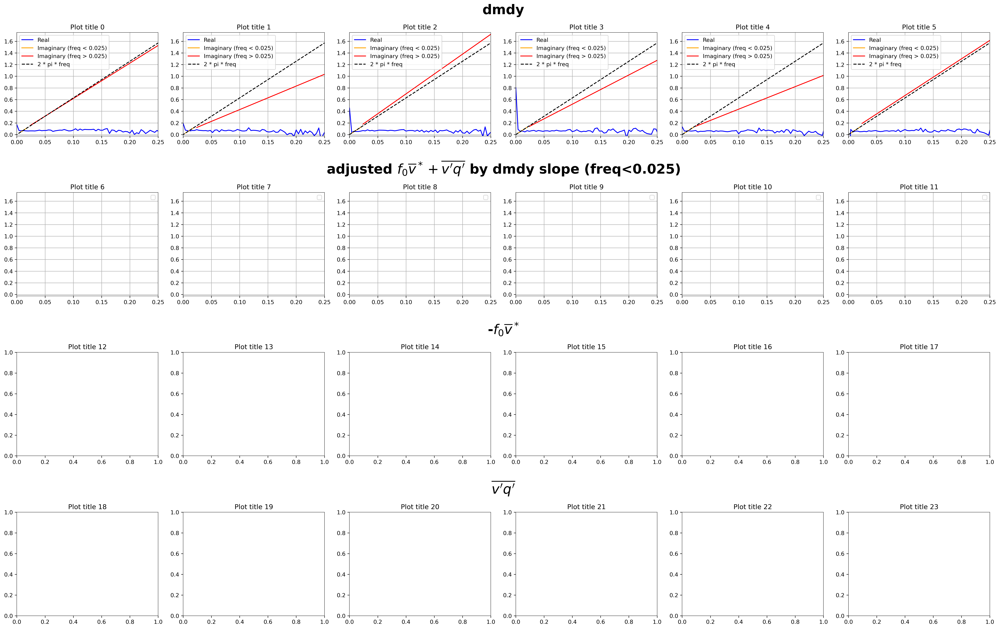

In [764]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fftfreq
from scipy.fft import fft, ifft, fftshift
# from numpy.fft import fft, fftfreq, hanning
# process fo v
num_exp = 6
num_lat = 32
z_final_for_MLclass = np.zeros((6,19500))
m_final_for_MLclass = np.zeros((6,19500))

from matplotlib.gridspec import SubplotSpec
def create_subtitle(fig: plt.Figure, grid: SubplotSpec, title: str):
    "Sign sets of subplots with title"
    row = fig.add_subplot(grid)
    # the '\n' is important
    row.set_title(f'{title}\n', fontweight='bold', fontsize=24)
    # hide subplot
    row.set_frame_on(False)
    row.axis('off')
def process_wind_data(v_star, f0, num_lat, day):
    f0v_star = np.zeros((day, num_lat))
    for i in range(num_lat):
        f0v_star[:, i] = np.nanmean(v_star[:, :, i], axis=1) * f0[i + num_lat]
    return f0v_star
# Function to perform FFT and plot
def compute(a, u_50_w, m_right_current, title_suffix):
    """Compute EOF, FFT, and plot the results on given axes."""
    # u_normalized = (u_50[a] - np.nanmean(u_50[a])) / np.nanstd(u_50[a])

    single_EOF_50 = EOF((u_50[a,:,:] * cy[32:]**0.5,), n_components=num_lat, field="1D")
    single_EOF_50.get()

    z     = single_EOF_50.PC[0,:]
    EOFs  = single_EOF_50.EOF[0,:]
    z_std = z.std()
    
    z    /= z_std # no
    EOFs *= z_std # m/s

    m_right_current[a] *=  cy[32:]**0.5 # m^2 / s^2
    # m_right_current_new = (m_right_current[a] - m_right_current[a].mean()) / m_right_current[a].std()
    
    m = (m_right_current[a,:,:] ).dot(EOFs[:]) / EOFs[:].dot(EOFs[:].T)
    m_final = m    #/ m.std() # / np.dot(EOF_try, EOF_try.T)**0.5 #* z.std()
    z_final = z    #* m.std() #/ z.std() # / np.dot(EOF_try, EOF_try.T)**0.5 #/ z.std()

    # FFT computation setup
    lg = 250
    overlap = 125
    N  = lg
    final_all = np.zeros(N, dtype=complex)
    n_segments = 0
    hanning_window = np.hanning(lg)

    test = np.fft.fftfreq(250, 1)
    freq_shiht =  fftshift(test)
    
    for i in range(0, len(z) - lg + 1, lg - overlap):
        Z_segment = (fft(z_final[i:i+lg] * hanning_window)) #/ len(z_paper_final[i:i+lg])
        M_segment = (fft(m_final[i:i+lg] * hanning_window))       #/ len(m_final[i:i+lg])
        
        M_star = np.conjugate(M_segment)
        Z_star = np.conjugate(Z_segment)

        # Compute the cross-spectrum
        final = (M_segment * Z_star) / (Z_star * Z_segment) 
        final_all += final
        n_segments += 1
        
    final_all /=  n_segments 
    final_all_shift = fftshift(final_all)    
    #########################################################
    # adjust = np.zeros(5)
    # k = 0
    # for i in range(5):
    #     adjust[k] = (final_all_shift[k+126].imag)
    #     k += 1
    # # print(freq_shiht[126] * 2 * np.pi)
    # Alpha  = np.nanmean(final_all_shift[126].real)
    # Beta   = np.nanmean(final_all_shift[126].imag / (freq_shiht[126] * 2 * np.pi))
    # print("Alpha:", Alpha)
    # print("Beta:", Beta)
    # print("Beta/Alpha:", Beta / Alpha)
    # tau = Beta / Alpha
    return freq_shiht, final_all_shift
    
def pplot(freq_shiht, final_all_shift, slope, ax):
    if np.array(slope).any() == 0:
        # slope = 1/ np.nanmean(final_all_shift.imag[130]+final_all_shift.imag[129]+final_all_shift.imag[131]) * np.nanmean(freq_shiht[130]+freq_shiht[129]+freq_shiht[131])* 2 * np.pi
        slope_lf = np.polyfit(freq_shiht[126:131], final_all_shift.imag[126:131], 1) 
        slope_hf = np.polyfit(freq_shiht[131:200], final_all_shift.imag[131:200], 1) 
        
        
        print((final_all_shift[131:].imag * slope_lf[0]/slope_hf[0] + slope_hf[1]) )
        # mean it's first plotting for dmdy
        ax.plot(freq_shiht, final_all_shift.real*86400 , label="Real", color="Blue")
        ax.plot(freq_shiht[126:131], freq_shiht[126:131] * 2 * np.pi, label="Imaginary (freq < 0.025)", color="orange")
        ax.plot(freq_shiht[131:], (final_all_shift.imag[131:] * slope_lf[0] + slope_hf[1]) * 86400, label="Imaginary (freq > 0.025)", color="Red")
        ax.plot(freq_shiht, freq_shiht * 2 * np.pi, '--', label="2 * pi * freq", color="black")
        
        ax.set_xlim([0, 0.25])
        ax.set_ylim([-0.025,1.75])
        ax.set_title(f"PR={a*10}", fontsize=12)
        ax.grid()
        ax.legend()

        return slope_lf, slope_hf
    else:
        # # adjust plot
        # ax.plot(freq_shiht, final_all_shift.real*86400 , label="Real", color="Blue")
        # ax.plot(freq_shiht, (slope[0]*freq_shiht + slope[1])* 86400, label="Imaginary", color="orange")
        # ax.plot(freq_shiht, freq_shiht * 2 * np.pi, '--', label="2 * pi * freq", color="black")
        
        ax.set_xlim([0, 0.25])
        ax.set_ylim([-0.025,1.75])
        ax.set_title(f"PR={a*10}", fontsize=12)
        ax.grid()
        ax.legend()
        return _
        
    

# Plot setup
m_right = np.zeros(((num_exp, day, num_lat)))
# y = np.linspace(0,90,32)
# yr = np.deg2rad(y)
# cy = np.cos(yr)
fig, ax = plt.subplots(4, 6, figsize=(25, 16), dpi=300)
u_50_w  = np.zeros(u_50.shape)
for a in range(num_exp):
    # Update u_50_w with cy correction
    u_50   = np.nanmean(Uzm[:,:,:,num_lat:], axis=2)
    for i in range(num_lat): # Assuming cy[0] and [-1] are np.nan
        # print(i+num_lat)
        u_50_w[a,:,i] = u_50[a,:,i] * (cy[i+num_lat])**0.5

    # First type - only f0v_star
    # f0v_star = process_wind_data(v_star[a], f0, num_lat, day)
    v_star_vi = np.nanmean(v_star[:,:,:,:], axis=2)
    # print(f0v_star.shape)
    # print(v_star_vi.shape)
    f0v_star = np.zeros(((num_exp, day, num_lat)))
    for i in range(num_lat):
        f0v_star[a,:,i] = v_star_vi[a,:,i] * f0[i+num_lat]
    # m_right[a] = f0v_star[a]
    # compute_and_plot(a, ax[2, a], u_50_w, m_right, "-f0v_star")

    # Second type - f0v_star + mean(vq_final)   
    m_right[a] =   np.nanmean(dmdy[a,:,:,32:], axis=1) 
    freq_shiht, final_all_shift_dmdy = compute(a, u_50_w, m_right, "dmdy") 
    slope_lf, slope_hf = pplot(freq_shiht, final_all_shift_dmdy, int(0), ax[0, a])

    # Second type - f0v_star + mean(vq_final)   
    m_right[a] =   f0v_star[a] + np.nanmean(vq_final[a], axis=1) 
    freq_shiht, final_all_shift_star = compute(a, u_50_w, m_right, "f0v_star + mean(vq_final)")
    _ = pplot(freq_shiht, final_all_shift_star, slope_lf, ax[1, a])
    # z_final_for_MLclass[a] = z_final
    # m_final_for_MLclass[a] = m_final
   
    
    # Third type - only mean(vq_final)
    # m_right[a] = np.nanmean(vq_final[a], axis=1)
    # compute_and_plot(a, ax[3, a], u_50_w, m_right, "mean(vq_final)")

# title    
rows = 4
cols = 6

for i, ax in enumerate(ax.flatten()):
    ax.set_title(f'Plot title {i}')

grid = plt.GridSpec(rows, cols)
create_subtitle(fig, grid[0, ::], "dmdy")
create_subtitle(fig, grid[1, ::], r"adjusted $f_{0} \overline{v}^* + \overline{v'q'}$ by dmdy slope (freq<0.025)")

create_subtitle(fig, grid[2, ::], r"-$f_{0} \overline{v}^* $")
create_subtitle(fig, grid[3, ::], r"$\overline{v'q'}$")
fig.tight_layout()
fig.set_facecolor('w')

plt.tight_layout()
# plt.savefig(r"/work/PeterChang/back_to_master1220/Moist_Dycore/IdealizeSpetral.jl/exp/HSt42/paper1_fig/fig3_negative.png", bbox_inches='tight', dpi=600.)
plt.show()


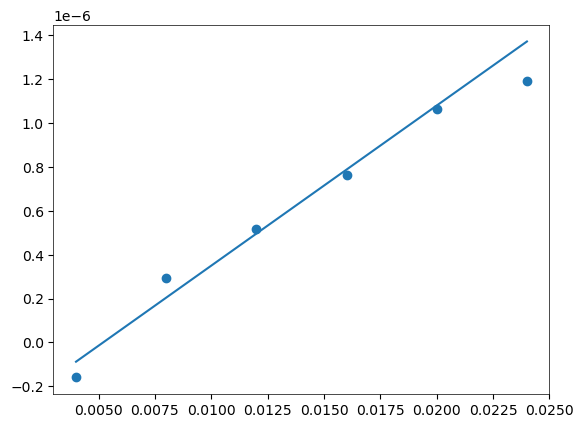

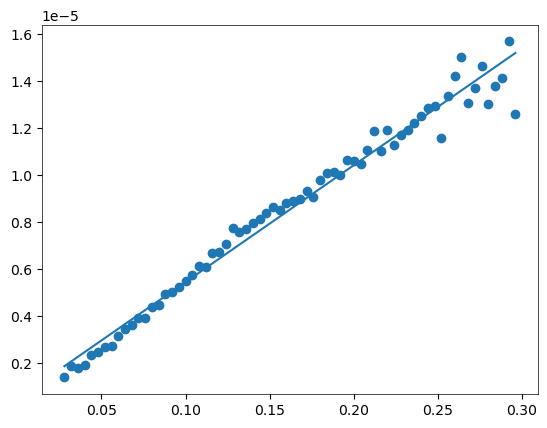

In [758]:
plt.figure()
plt.scatter(freq_shiht[126:132], final_all_shift[126:132].imag)
plt.plot(freq_shiht[126:132], slope_lf[0] * freq_shiht[126:132] + slope_lf[1])

plt.figure()
plt.scatter(freq_shiht[132:-50], final_all_shift[132:-50].imag)
plt.plot(freq_shiht[132:-50], slope_hf[0] * freq_shiht[132:-50] + slope_hf[1])

In [679]:
print(freq_shiht[126:132])

print(final_all_shift[126:132].imag)

[0.004 0.008 0.012 0.016 0.02  0.024]
[-1.59522720e-07  2.94364038e-07  5.15687083e-07  7.62469937e-07
  1.06423350e-06  1.18807425e-06]


In [458]:
print(Vzm.shape)
print(np.sum(Vzm[-1,:,:,10], axis=(0,1)))

(6, 19500, 20, 64)
-7027.276516424971


Text(0.5, 1.0, 'EMF divergence')

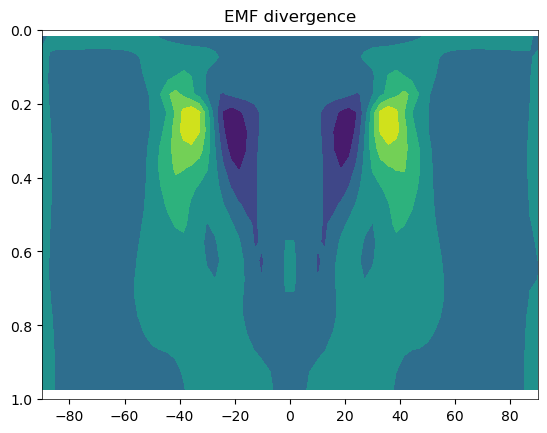

In [407]:
plt.figure()
plt.contourf(yy, sigma_mean2, dmdy[0].mean(axis=0))
plt.ylim([1,0])
plt.title("EMF divergence")

Text(0.5, 1.0, 'vq_final')

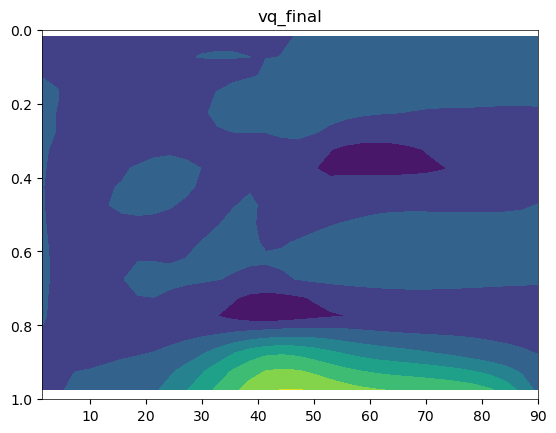

In [415]:
vq_final.shape
plt.figure()
plt.contourf(yy[:,32:], sigma_mean2[:,32:], vq_final[-1].mean(axis=0))
plt.ylim([1,0])
plt.title("vq_final")

In [325]:
# with h5py.File('PR0_50_500_20000day_z_final_for_MLclass.h5','w') as z_final_for_MLclass_file :
#     z_final_for_MLclass_file.create_dataset('z_final',data=z_final_for_MLclass)

# z_final_file      = h5py.File("PR0_50_500_20000day_z_final_for_MLclass.h5", "r")
# z_final_test     = np.asarray(z_final_file["z_final"][:,:])


In [ ]:
# with h5py.File('PR0_50_500_20000day_m_final_for_MLclass.h5','w') as m_final_for_MLclass_file :
#     m_final_for_MLclass_file.create_dataset('m_final',data=m_final_for_MLclass)

# z_final_file      = h5py.File("PR0_50_500_20000day_z_final_for_MLclass.h5", "r")
# z_final_test     = np.asarray(z_final_file["z_final"][:,:])


In [327]:
print(z_final_test.shape)

(6, 19500)


1.0
1.450400489888537
2.5506487703153316e-06
0.09411100562598364
0.15638126134384986
1.3548243249885534e-06


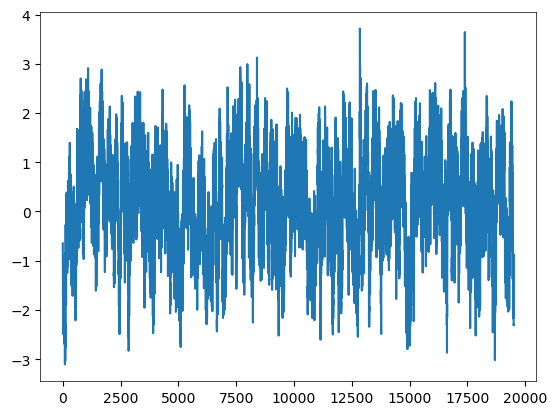

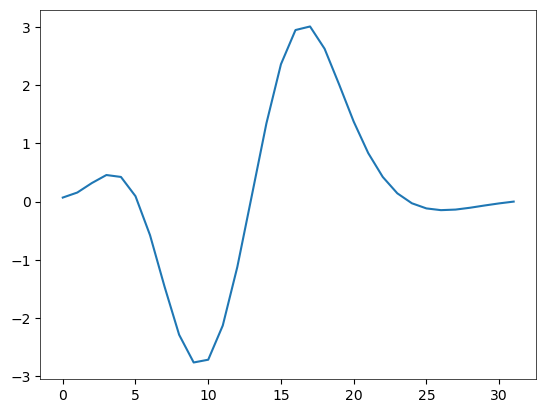

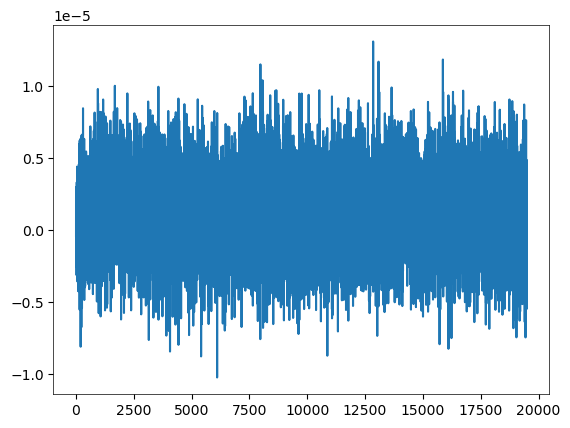

In [332]:
plt.figure()
plt.plot(z_final)
plt.figure()
plt.plot(EOFs)
plt.figure()
plt.plot(m_final)

print(z_final.std())
print(EOFs.std())
print(m_final.std())


print(z_final.mean())
print(EOFs.mean())
print(m_final.mean())


[-2.34856249 -2.36291691 -2.16074839 -1.69272203 -0.95919284  0.36129704
  2.64408957  5.80338347  9.29063716 12.42559452 14.64682991 15.63984067
 15.34848435 13.90851814 11.61729023  8.90853766  6.24840738  4.0020909
  2.35311508  1.30343877  0.73915587  0.5067054   0.4612324   0.49013871
  0.51815248  0.50487658  0.44269983  0.34531352  0.23246426  0.1249586
  0.04253074         nan]


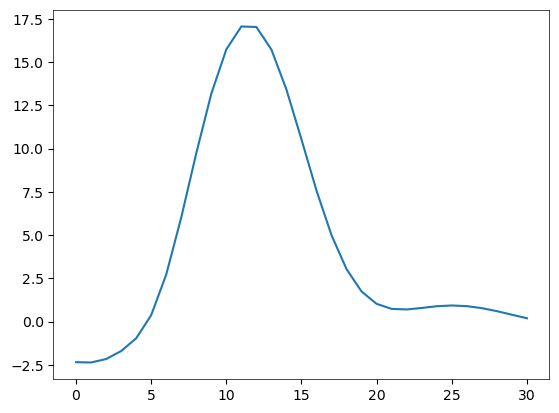

In [385]:
plt.figure()
plt.plot(u_50_w[a].mean(axis=0))
print(u_50[a,:,:].mean(axis=0) * cy[32:])

In [1082]:
xxx = np.zeros(3) #np.array([1,2,3])
yyy = np.array([4,5,6])

xy = xxx + yyy * 1j

In [1084]:
xy = yyy + xxx * 1j

In [1085]:
print(xy)

[4.+0.j 5.+0.j 6.+0.j]


In [1089]:
(freq[idx][101:106]) * 2 * np.pi

array([0.03141593, 0.06283185, 0.09424778, 0.12566371, 0.15707963])

In [1177]:
freq[idx[101:106]]

array([0.005, 0.01 , 0.015, 0.02 , 0.025])

In [1231]:
final_all[idx[101]].imag / (2 * np.pi*freq[idx[101]]) / final_all[idx[101]].real

4.3123765794169655

In [1275]:
(2 * np.pi * freq[idx[101:103]])

array([0.02513274, 0.05026548])

In [1274]:
freq.shape

(250,)